---

_© Mohammad M. Ajallooeian, All Rights Reserved._

This notebook was created for educational purposes and parts of it is the intellectual property of Mohammad M. Ajallooeian. Generative AI tools, including but not limited to ChatGPT, DALL·E, Midjourney, and Gemini, may have been utilized in the creation of this notebook to generate content, visualizations, or other elements. All content generated has been verified and edited to ensure accuracy and educational value. Unauthorized reproduction or distribution of this material is prohibited without prior written permission from the author.

---

# CMPT 3520 Machine Learning II Course Project: Counting and Detecting LEGO Pieces

The notebook is structured for a machine learning project focusing on counting and detecting LEGO pieces. It's divided into two main phases:

**Phase 1:** Classical Computer Vision Techniques for LEGO Piece Counting

This phase explores traditional computer vision methods for segmenting images of LEGO pieces. It covers the following:

- **Introduction:** Explains the concept of image segmentation and its importance.
- **Data:** Provides instructions on dataset preparation, including downloading images and setting up the folder structure.
- **OpenCV:** Introduces the OpenCV library, outlining its capabilities for image processing and computer vision tasks.
- **Thresholding:** Demonstrates how to use thresholding for segmentation, including global and adaptive techniques.
- **Edge Detection:** Shows how to apply the Canny Edge Detector to detect outlines of LEGO pieces.
- **Color-Based Segmentation:** Discusses RG chromaticity and color-based segmentation to distinguish regions based on color.
- **Putting Everything Together:** Focuses on histogram-based threshold selection, automated thresholding, and image pre-processing methods. It also covers contour detection, filtering incorrect contours, and counting valid contours to estimate LEGO pieces.

**Phase 2:** Deep Learning for Object Detection of LEGO Pieces

This phase employs deep learning techniques for object detection. It covers the following:

- **Introduction:** Introduces object detection, frameworks like YOLO, and dataset preparation.
- **Dataset Preparation:** Provides instructions for loading, splitting, and visualizing the LEGO dataset.
- **Building and Training the Object Detection Model:** Guides through model selection (YOLOv3), installation, configuration, training, saving, and loading.
- **Evaluating the Model’s Performance:** Discusses evaluation metrics like IoU, precision, recall, and mAP, and how to assess the model’s accuracy.
- **Saving the Model and Performing Inference:** Demonstrates how to save the trained model and use it for inference on new images, visualizing the results.

---

## Phase 2: Deep Learning for Object Detection of LEGO Pieces

### 2.1 Introduction to Object Detection and Dataset Preparation

#### Overview of Object Detection

In this phase, we will use deep learning to detect LEGO pieces in images. Object detection involves identifying and localizing objects within an image, often by drawing bounding boxes around them. For this project, we will focus on detecting and counting LEGO pieces without differentiating them by color or type.

#### Object Detection Frameworks

Several popular frameworks are available for object detection, including:
- **YOLO (You Only Look Once)**: A real-time object detection framework.
- **SSD (Single Shot MultiBox Detector)**: Fast and efficient, suitable for applications requiring real-time processing.
- **Mask R-CNN**: A versatile framework that provides bounding boxes and segmentation masks, though it is slower than YOLO and SSD.

For this project, you may choose any framework, but we’ll provide starter code using **YOLO** for simplicity and speed.

Here is a [tutorial about object detection and finetuning with PyTorch using Mask R-CNN](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)

#### Dataset Preparation

To train a deep learning model, we need a large dataset. In this project, you’ll use a [dataset with annotated images of LEGO pieces](https://www.kaggle.com/datasets/dreamfactor/biggest-lego-dataset-600-parts). The dataset will need to be split into three parts:
- **Training Set (70%)**: Used to train the model.
- **Validation Set (15%)**: Used to fine-tune hyperparameters and avoid overfitting.
- **Test Set (15%)**: Used to evaluate the model’s performance.

In the following steps, you will:
1. Download and prepare the dataset.
2. Divide the dataset into training, validation, and test sets.
3. Explore the dataset and inspect a few samples to ensure proper annotations.

**Note**: The images are synthetic, and the annotations follow the [PASCAL VOC](http://host.robots.ox.ac.uk/pascal/VOC/) format. These are a lot of images! You probably do not need all of them. Feel free to reduce your dataset.

In [1]:
# # Import necessary libraries for dataset handling
# from sklearn.model_selection import train_test_split
# import xml.etree.ElementTree as ET

---

### Instructions for This Section

1. **Download and Load the Dataset**:
   - Ensure you have access to the dataset and load it using Python.
2. **Split the Dataset**:
   - Use Python’s libraries to split the dataset into training, validation, and test sets.
3. **Visualize Sample Images and Annotations**:
   - Display a few sample images with their bounding boxes to confirm the data is correctly loaded and annotated.

**Deliverables for this Section:**
- Documentation on dataset preparation, including the data split.
- Visualizations of sample images with annotations.

## 2.1 Dataset Preparation

In [2]:
!pip install kagglehub
!pip install xmltodict # for annotations in XML (Pascal VOC)

# import json
# from kagglehub import dataset_download as KaggleHubDownloader

In [3]:
# Libraries
import kagglehub
import os
import random
import shutil
import numpy as np
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2 as cv
import yaml
import itertools

# from ultralytics import YOLO

In [4]:
# import kagglehub

path = kagglehub.dataset_download("dreamfactor/biggest-lego-dataset-600-parts")

print("Path to dataset files:", path)

100%|██████████| 7.68G/7.68G [01:23<00:00, 98.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/dreamfactor/biggest-lego-dataset-600-parts/versions/1


### **1. Taking subset of legodataset**

In [5]:
# import os
# import random
# import shutil
# import numpy as np

# Paths to the full dataset and subset directories
full_images_dir = "/root/.cache/kagglehub/datasets/dreamfactor/biggest-lego-dataset-600-parts/versions/1/dataset_20210629145407_top_600/images"
full_annotations_dir = "/root/.cache/kagglehub/datasets/dreamfactor/biggest-lego-dataset-600-parts/versions/1/dataset_20210629145407_top_600/annotations"
subset_images_dir = "/content/legodata_subset/images"
subset_annotations_dir = "/content/legodata_subset/annotations"

# Create directories for subset images and annotations if they don't exist
os.makedirs(subset_images_dir, exist_ok=True)  # Create subset images directory
os.makedirs(subset_annotations_dir, exist_ok=True)  # Create subset annotations directory

# Number of images to include in the subset
sample_size = 100

# Get a list of all image files in the full dataset images directory
all_images = os.listdir(full_images_dir)

# Randomly select the specified number of images for the subset
subset_images = random.sample(all_images, sample_size)

# Copy the selected images and their corresponding annotation files to the subset folder
for image_name in subset_images:
    # Copy the image file from the full dataset to the subset directory
    image_source = os.path.join(full_images_dir, image_name)
    image_dest = os.path.join(subset_images_dir, image_name)
    shutil.copyfile(image_source, image_dest)  # Copy image file

    # Create the annotation file path based on the image name
    annotation_name = os.path.splitext(image_name)[0] + ".xml"  # Match .xml file with the image name
    annotation_source = os.path.join(full_annotations_dir, annotation_name)
    annotation_dest = os.path.join(subset_annotations_dir, annotation_name)

    # Check if the annotation file exists before copying
    if os.path.exists(annotation_source):
        shutil.copyfile(annotation_source, annotation_dest)  # Copy the annotation file
    else:
        # If annotation file doesn't exist, print a warning
        print(f"Warning: Annotation file {annotation_name} does not exist for image {image_name}")

# Print a message indicating the number of copied files
print(f"Copied {sample_size} images and their annotations to the subset directory.")



Copied 100 images and their annotations to the subset directory.


### **2. Directory Structure and Dataset Split**

1. Defining directories for the split as instructed here
https://docs.ultralytics.com/yolov5/tutorials/train_custom_data/#23-organize-directories

split lego images into train, val, test and copy corresponding annotations to its appropriate folders

In [6]:
import os
import random
import shutil

# Create the main directory for the subset data
os.makedirs('/content/legodata_subset/split', exist_ok=True)

# Define the paths for images and annotations
images_dir = "/content/legodata_subset/images"
annotations_dir = "/content/legodata_subset/annotations"

# Define the directories for training, validation, and test sets
train_images_dir = "/content/legodata_subset/split/images/train"
train_annotations_dir = "/content/legodata_subset/split/annotations/train"

val_images_dir = "/content/legodata_subset/split/images/val"
val_annotations_dir = "/content/legodata_subset/split/annotations/val"

test_images_dir = "/content/legodata_subset/split/images/test"
test_annotations_dir = "/content/legodata_subset/split/annotations/test"

# Create the directories for training, validation, and test sets if they don't exist
os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_annotations_dir, exist_ok=True)

os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_annotations_dir, exist_ok=True)

os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_annotations_dir, exist_ok=True)


## ---- Splitting the subset data into train, validation, and test sets ----

# Get the list of all image files from the images directory
all_images = os.listdir(images_dir)

# Shuffle the image list to ensure random distribution of the data
random.shuffle(all_images)

# Calculate the number of samples for each dataset (train, validation, test)
train_size = int(0.7 * len(all_images))  # 70% of the data for training
val_size = int(0.15 * len(all_images))  # 15% of the data for validation
test_size = len(all_images) - train_size - val_size  # Remaining 15% for testing

# Split the shuffled image list into train, validation, and test sets
train_images = all_images[:train_size]
val_images = all_images[train_size:train_size + val_size]
test_images = all_images[train_size + val_size:]

# Helper function to copy the images and their corresponding annotation files
def copy_files(image_list, source_images_dir, source_annotations_dir, dest_images_dir, dest_annotations_dir):
    for image_name in image_list:
        # Copy the image file from the source to the destination directory
        image_source = os.path.join(source_images_dir, image_name)
        image_dest = os.path.join(dest_images_dir, image_name)
        shutil.copyfile(image_source, image_dest)

        # Copy the corresponding annotation file (XML)
        annotation_name = os.path.splitext(image_name)[0] + ".xml"
        annotation_source = os.path.join(source_annotations_dir, annotation_name)
        annotation_dest = os.path.join(dest_annotations_dir, annotation_name)

        # If the annotation file exists, copy it; otherwise, print a warning
        if os.path.exists(annotation_source):
            shutil.copyfile(annotation_source, annotation_dest)
        else:
            print(f"Warning: Annotation file {annotation_name} does not exist for image {image_name}")

# Copy the image and annotation files to their respective directories
copy_files(train_images, images_dir, annotations_dir, train_images_dir, train_annotations_dir)
copy_files(val_images, images_dir, annotations_dir, val_images_dir, val_annotations_dir)
copy_files(test_images, images_dir, annotations_dir, test_images_dir, test_annotations_dir)

# Print a message indicating that the dataset has been successfully split
print("Dataset has been split into training, validation, and test sets.")


Dataset has been split into training, validation, and test sets.


### **3. Pascal VOC to YOLO format**
Convert the dataset of images and Pascal VOC annotations into the YOLO format required for training

In [7]:
# Define the base directory for the split data (train, val, test)
base_dir = "/content/legodata_subset/split"

# Define the paths for images, annotations, and labels based on the base directory
images_dir = os.path.join(base_dir, "images")  # Images will be stored in subdirectories: train, val, test
annotations_dir = os.path.join(base_dir, "annotations")  # Annotations will also be in subdirectories: train, val, test
labels_dir = os.path.join(base_dir, "labels")  # Labels (in YOLO format) will be saved in subdirectories: train, val, test

# Create the 'labels' directory structure if it doesn't exist
os.makedirs(labels_dir, exist_ok=True)  # Create main labels directory
os.makedirs(os.path.join(labels_dir, 'train'), exist_ok=True)  # Create 'train' subdirectory for labels
os.makedirs(os.path.join(labels_dir, 'val'), exist_ok=True)  # Create 'val' subdirectory for labels
os.makedirs(os.path.join(labels_dir, 'test'), exist_ok=True)  # Create 'test' subdirectory for labels


## ---- Function to write image paths for training, validation, and testing ----

# Function to write paths to text files for image directories (required for YOLO model)
def write_image_annotation_paths(image_dir, file_name):
    with open(file_name, 'w') as f:
        # Loop through the images in the specified directory
        for image_name in os.listdir(image_dir):
            image_path = os.path.join(image_dir, image_name)
            # Ensure the file is an image file (either .png, .jpg, or .jpeg)
            if os.path.exists(image_path) and image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                f.write(f"{image_path}\n")  # Write the image path to the file

# Write image paths for train, valid, and test splits into separate text files
write_image_annotation_paths(os.path.join(images_dir, 'train'), "/content/legodata_subset/train.txt")
write_image_annotation_paths(os.path.join(images_dir, 'val'), "/content/legodata_subset/valid.txt")
write_image_annotation_paths(os.path.join(images_dir, 'test'), "/content/legodata_subset/test.txt")


## ---- Define Class Mapping and YOLO Annotation Conversion ----

# Define the mapping for classes (only one class 'LEGO_piece' for this dataset)
class_mapping = {
    'LEGO_piece': 0  # Class 0 for LEGO pieces
}

# Function to convert XML annotation to YOLO format (class x_center y_center width height)
def convert_annotation_to_yolo(xml_file, image_width, image_height):
    """
    Convert XML annotation to YOLO format (class x_center y_center width height)
    """
    tree = ET.parse(xml_file)  # Parse the XML file
    root = tree.getroot()  # Get the root element of the XML

    yolo_labels = []  # List to store YOLO formatted labels

    # Extract bounding box data for each object in the XML
    for obj in root.findall('object'):
        class_name = obj.find('name').text  # Get the name of the object (class name)

        # Map the class to the 'LEGO_piece' class (class 0)
        class_id = class_mapping.get(class_name, 0)  # Default to 'LEGO_piece' if class is not found

        # Get the bounding box coordinates
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        # Normalize coordinates to be relative to the image size (YOLO format)
        x_center = (xmin + xmax) / 2 / image_width
        y_center = (ymin + ymax) / 2 / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        # Append the YOLO formatted label to the list
        yolo_labels.append(f"{class_id} {x_center} {y_center} {width} {height}")

    return yolo_labels


## ---- Function to Write Image Paths with Relative Paths ----

# Update the write_image_annotation_paths function to use relative paths
def write_image_annotation_paths(image_dir, file_name):
    with open(file_name, 'w') as f:
        # Loop through the images in the directory
        for image_name in os.listdir(image_dir):
            image_path = os.path.join(image_dir, image_name)
            # Ensure the file is an image file
            if os.path.exists(image_path) and image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                relative_path = os.path.relpath(image_path, start=base_dir)  # Use relative path from base directory
                f.write(f"{relative_path}\n")  # Write the relative path to the file

# Write image paths for train, valid, and test splits into separate text files
write_image_annotation_paths(os.path.join(images_dir, 'train'), "/content/legodata_subset/train.txt")
write_image_annotation_paths(os.path.join(images_dir, 'val'), "/content/legodata_subset/valid.txt")
write_image_annotation_paths(os.path.join(images_dir, 'test'), "/content/legodata_subset/test.txt")


## ---- Process Images and Annotations ----

# Function to process images and annotations, converting annotations to YOLO format and saving to label folder
def process_images_and_annotations():
    """
    Loop through images and annotations, convert to YOLO format, and save to labels folder
    """
    # Loop through train, val, and test subdirectories
    for split in ['train', 'val', 'test']:  # Adjust based on your dataset structure
        image_subdir = os.path.join(images_dir, split)
        annotation_subdir = os.path.join(annotations_dir, split)
        label_subdir = os.path.join(labels_dir, split)

        if not os.path.exists(label_subdir):
            os.makedirs(label_subdir)  # Create label directory if not exists

        print(f"Processing {split} images and annotations...")

        # Process each image in the current split
        for image_name in os.listdir(image_subdir):
            if image_name.lower().endswith(('.jpg', '.jpeg', '.png', '.heic')):  # Include all image formats
                image_path = os.path.join(image_subdir, image_name)
                xml_filename = os.path.splitext(image_name)[0] + '.xml'  # Assuming the XML filename matches image filename
                xml_path = os.path.join(annotation_subdir, xml_filename)

                if os.path.exists(xml_path):  # Make sure XML exists for the image
                    # Get image size
                    image = cv.imread(image_path)
                    image_height, image_width, _ = image.shape

                    # Convert annotation to YOLO format
                    yolo_labels = convert_annotation_to_yolo(xml_path, image_width, image_height)

                    # If there are any labels, save them to the appropriate label file
                    if yolo_labels:
                        label_file_path = os.path.join(label_subdir, os.path.splitext(image_name)[0] + '.txt')
                        with open(label_file_path, 'w') as label_file:
                            for label in yolo_labels:
                                label_file.write(f"{label}\n")
                else:
                    print(f"XML file missing for {image_name}")
        print(f"Finished processing {split}.")

# Run the conversion process
process_images_and_annotations()

print("Conversion complete.")


## ---- Dataset Configuration for YOLO ----

# Define dataset configuration for YOLO
dataset_config = {
    'path': '/content/legodata_subset/split',  # Root directory for the dataset
    'train': 'images/train',  # train images (relative to 'path')
    'val': 'images/val',  # val images (relative to 'path')
    'test': 'images/test',  # test images (relative to 'path')
    'nc': 1,  # Number of classes (1 class: LEGO_piece)
    'names': ["LEGO_piece"]  # Class names
}

# Save the dataset configuration as dataset.yaml
with open('/content/legodata_subset/split/dataset.yaml', 'w') as file:
    yaml.dump(dataset_config, file)

print("dataset.yaml has been created with the updated directory structure.")


Processing train images and annotations...
Finished processing train.
Processing val images and annotations...
Finished processing val.
Processing test images and annotations...
Finished processing test.
Conversion complete.
dataset.yaml has been created with the updated directory structure.


### **4. Display sample images with bounding box**

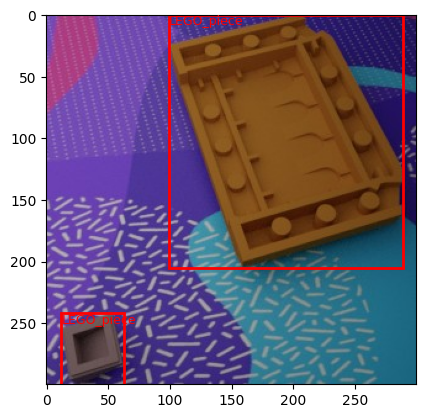

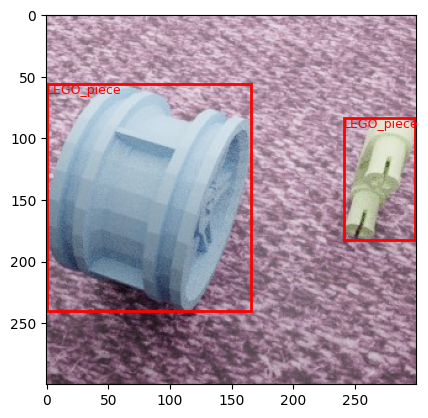

In [8]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import xml.etree.ElementTree as ET

# Function to parse XML and extract bounding boxes from annotation file
def parse_annotation(annotation_file):
    # Parse the XML file
    tree = ET.parse(annotation_file)
    root = tree.getroot()
    boxes = []

    # Loop through each object in the XML and extract bounding box coordinates
    for obj in root.findall('object'):
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)  # Minimum x-coordinate
        ymin = int(bndbox.find('ymin').text)  # Minimum y-coordinate
        xmax = int(bndbox.find('xmax').text)  # Maximum x-coordinate
        ymax = int(bndbox.find('ymax').text)  # Maximum y-coordinate
        boxes.append((xmin, ymin, xmax, ymax))  # Add box coordinates to list

    return boxes

# Function to visualize an image with bounding boxes from the annotation
def visualize_image_with_boxes(image_file, annotation_file):
    # Open the image using PIL
    image = Image.open(image_file)
    plt.imshow(image)  # Display the image

    # Parse the annotation file to get bounding boxes
    boxes = parse_annotation(annotation_file)

    # Create a plot for the bounding boxes
    ax = plt.gca()
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        # Draw a rectangle for each bounding box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)  # Add rectangle to the image

        # Optionally, add a label for the bounding box (in this case, 'LEGO_piece')
        ax.text(xmin, ymin, 'LEGO_piece', color='r', fontsize=9, verticalalignment='top')

    plt.show()  # Display the image with bounding boxes

# Visualize a few sample images with annotations from the training set
sample_images = train_images[:2]  # Select the first two sample images
for image_name in sample_images:
    # Construct file paths for image and corresponding annotation file
    image_file = os.path.join(train_images_dir, image_name)
    annotation_file = os.path.join(train_annotations_dir, os.path.splitext(image_name)[0] + ".xml")

    # Visualize the image with bounding boxes
    visualize_image_with_boxes(image_file, annotation_file)

## Rubric for Dataset Preparation Section

| Criteria                     | Excellent (9-10)  | Good (5-8)            | Needs Improvement (1-4) |
|------------------------------|----------------|------------------------|--------------------------|
| **Dataset Loading**          | Successfully loads and splits the dataset, following instructions accurately. | Loads and splits the dataset with minor issues or requires improvement in documentation. | Incorrect loading or splitting of the dataset, lacks proper documentation. |
| **Visualization & Inspection** | Provides clear visualizations of sample images with bounding boxes, confirms correct annotations. | Provides visualization,

## 2.2 Building and Training the Object Detection Model

#### Model Selection and Setup

In this section, you will select an object detection model to train on your LEGO dataset. YOLO (You Only Look Once) is a great choice due to its speed and accuracy. For this project, we will use the [YOLOv3 architecture](https://github.com/ultralytics/yolov3?tab=readme-ov-file), which is well-suited for detecting multiple objects within an image.

#### Steps to Set Up and Train the Model

1. **Install YOLO and Dependencies**:
   - Install any necessary libraries and download the YOLOv3 weights file.
2. **Model Configuration**:
   - Set up the model configuration to align with your dataset, defining the input dimensions and the number of classes.
3. **Train the Model**:
   - Train the model on the training dataset, using the validation set to monitor the training progress and adjust hyperparameters.
4. **Save and Load the Trained Model**:
   - Save the trained model so it can be reused later for inference on new images.

**Deliverables for This Section**:
- Explanation of the model selection and why it was chosen.
- Training script with comments on hyperparameters and their tuning process.

---

### Instructions for This Section

1. **Download YOLOv3 Weights and Configuration Files**:
   - You can find these files on the [official YOLO website](https://github.com/ultralytics/yolov3?tab=readme-ov-file) or through a third-party source.
2. **Set Up the Model Using OpenCV or a Deep Learning Framework (e.g., PyTorch)**:
   - Follow the starter code provided to configure the YOLO model.
3. **Train the Model**:
   - Use the training data to train the model, and adjust the learning rate, batch size, and other hyperparameters as needed.

install YOLO and dependencies

In [9]:
!pip install ultralytics==8.3.40

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 14.2 MB/s eta 0:00:00


Run 1

In [ ]:
from ultralytics import YOLO

# Load YOLOv3 model
model = YOLO('yolov5s.pt')
dataset = "/content/legodata_subset/split/dataset.yaml"

# Experiment 1
epochs = 15
batch_size = 8
learning_rate = 0.001
img_size = 640
device = 'cpu'

print(f"Run 1: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")


results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    imgsz=img_size,
    project="lego_detection",
    name=f"run1_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 17.7M/17.7M [00:00<00:00, 109MB/s] 


Run 1: epochs=15, batch_size=8, lr=0.001, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=15, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=lego_detection, name=run1_epochs15_bs8_lr0.001, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=Fal

100%|██████████| 755k/755k [00:00<00:00, 20.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      3520  ultralytics.nn.modules.conv.Conv             [3, 32, 6, 2, 2]              
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     18816  ultralytics.nn.modules.block.C3              [64, 64, 1]                   
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    115712  ultralytics.nn.modules.block.C3              [128, 128, 2]                 
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  3    625152  ultralytics.nn.modules.block.C3              [256, 256, 3]                 
  7                  -1  1   1180672  ultralytics

train: Scanning /content/legodata_subset/split/labels/train... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<00:00, 1154.21it/s]

train: New cache created: /content/legodata_subset/split/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/legodata_subset/split/labels/val... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<00:00, 1581.05it/s]

val: New cache created: /content/legodata_subset/split/labels/val.cache


Plotting labels to lego_detection/run1_epochs15_bs8_lr0.001/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run1_epochs15_bs8_lr0.001
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      0.825      1.913      1.188         34        640: 100%|██████████| 9/9 [02:39<00:00, 17.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.14s/it]

                   all         15         56      0.827      0.767      0.881      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G     0.7878      1.298       1.19         17        640: 100%|██████████| 9/9 [02:30<00:00, 16.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.71s/it]

                   all         15         56      0.935      0.857      0.942       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G      0.714     0.9544      1.094         54        640: 100%|██████████| 9/9 [02:32<00:00, 16.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.63s/it]

                   all         15         56      0.974      0.893      0.966      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G     0.7791       1.06       1.17         26        640: 100%|██████████| 9/9 [02:33<00:00, 17.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.93s/it]

                   all         15         56      0.939      0.839      0.918      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G     0.7683     0.9613      1.109         22        640: 100%|██████████| 9/9 [02:28<00:00, 16.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.16s/it]

                   all         15         56      0.837      0.857      0.886      0.787


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G     0.7221      1.041      1.072         18        640: 100%|██████████| 9/9 [02:25<00:00, 16.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.21s/it]

                   all         15         56      0.865      0.893       0.93      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15         0G     0.7094      1.026      1.115         16        640: 100%|██████████| 9/9 [02:28<00:00, 16.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.91s/it]

                   all         15         56      0.838      0.832      0.877      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G     0.7482     0.9612      1.107         16        640: 100%|██████████| 9/9 [02:35<00:00, 17.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.84s/it]

                   all         15         56      0.745      0.732      0.755      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G     0.6305     0.7789      1.015         19        640: 100%|██████████| 9/9 [02:29<00:00, 16.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.53s/it]

                   all         15         56      0.774      0.821      0.831      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15         0G      0.671     0.8451      1.075         12        640: 100%|██████████| 9/9 [02:27<00:00, 16.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.01s/it]

                   all         15         56      0.975      0.839      0.934        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G     0.6765     0.7448      1.035         17        640: 100%|██████████| 9/9 [02:35<00:00, 17.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.84s/it]

                   all         15         56      0.936      0.893      0.929      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G     0.6343     0.7249      1.028         21        640: 100%|██████████| 9/9 [02:29<00:00, 16.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.77s/it]

                   all         15         56      0.978      0.893       0.97      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G     0.6468     0.7371       1.05         18        640: 100%|██████████| 9/9 [02:28<00:00, 16.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:14<00:00, 14.58s/it]

                   all         15         56      0.989      0.893      0.982      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15         0G     0.6204      0.735      1.032         20        640: 100%|██████████| 9/9 [02:27<00:00, 16.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.22s/it]

                   all         15         56      0.962      0.905       0.98      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G      0.574     0.6505      1.003         18        640: 100%|██████████| 9/9 [02:28<00:00, 16.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.12s/it]

                   all         15         56       0.96      0.911      0.983      0.859



15 epochs completed in 0.684 hours.
Optimizer stripped from lego_detection/run1_epochs15_bs8_lr0.001/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run1_epochs15_bs8_lr0.001/weights/best.pt, 18.5MB

Validating lego_detection/run1_epochs15_bs8_lr0.001/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.37s/it]


                   all         15         56      0.974      0.893      0.966      0.866
Speed: 2.4ms preprocess, 675.8ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to lego_detection/run1_epochs15_bs8_lr0.001


Run 2

In [ ]:
# Experiment 2
epochs = 15
batch_size = 16
learning_rate = 0.0005
img_size = 640

print(f"Run 2: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")

results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    imgsz=img_size,
    project="lego_detection",
    name=f"run2_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)


Run 2: epochs=15, batch_size=16, lr=0.0005, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=0, project=lego_detection, name=run2_epochs15_bs16_lr0.0005, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augmen

train: Scanning /content/legodata_subset/split/labels/train.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/legodata_subset/split/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<?, ?it/s]

Plotting labels to lego_detection/run2_epochs15_bs16_lr0.0005/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run2_epochs15_bs16_lr0.0005
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      0.622     0.8795      1.035         28        640: 100%|██████████| 5/5 [03:04<00:00, 36.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.13s/it]

                   all         15         56      0.947      0.957      0.979      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G      0.588      0.774      1.024         20        640: 100%|██████████| 5/5 [02:36<00:00, 31.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.07s/it]

                   all         15         56      0.947      0.963      0.978      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G     0.6951     0.7693      1.061         49        640: 100%|██████████| 5/5 [02:36<00:00, 31.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.78s/it]

                   all         15         56      0.943      0.883      0.938      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G      0.654     0.8528      1.041         29        640: 100%|██████████| 5/5 [02:33<00:00, 30.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.28s/it]

                   all         15         56      0.958      0.875       0.94      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G     0.6705     0.7985      1.046         20        640: 100%|██████████| 5/5 [02:35<00:00, 31.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.37s/it]

                   all         15         56       0.96      0.867      0.959      0.842


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G     0.5941     0.8027     0.9794         18        640: 100%|██████████| 5/5 [02:31<00:00, 30.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.01s/it]

                   all         15         56      0.938      0.875      0.966      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15         0G     0.5674     0.7435      1.003         16        640: 100%|██████████| 5/5 [02:32<00:00, 30.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.24s/it]

                   all         15         56      0.938      0.839      0.877       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G     0.5958     0.7421      1.003         16        640: 100%|██████████| 5/5 [02:32<00:00, 30.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.861      0.911      0.949      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G     0.5566     0.6347     0.9699         19        640: 100%|██████████| 5/5 [02:34<00:00, 30.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.19s/it]

                   all         15         56      0.853      0.893      0.913      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15         0G     0.6374     0.7595      1.096         12        640: 100%|██████████| 5/5 [02:33<00:00, 30.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.11s/it]

                   all         15         56      0.981      0.928      0.958       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G     0.5596     0.6007      0.949         17        640: 100%|██████████| 5/5 [02:34<00:00, 30.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.06s/it]

                   all         15         56      0.946      0.945      0.968      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G     0.5527     0.6655     0.9657         21        640: 100%|██████████| 5/5 [02:31<00:00, 30.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.22s/it]

                   all         15         56      0.963      0.964      0.983      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G     0.5644     0.6273      1.006         18        640: 100%|██████████| 5/5 [02:28<00:00, 29.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.94s/it]

                   all         15         56      0.961      0.982      0.984      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15         0G     0.5833     0.5806      1.014         20        640: 100%|██████████| 5/5 [02:30<00:00, 30.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.32s/it]

                   all         15         56      0.964      0.982      0.982      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G     0.4928     0.5115     0.9587         18        640: 100%|██████████| 5/5 [02:33<00:00, 30.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.14s/it]

                   all         15         56      0.962      0.964      0.984      0.903



15 epochs completed in 0.699 hours.
Optimizer stripped from lego_detection/run2_epochs15_bs16_lr0.0005/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run2_epochs15_bs16_lr0.0005/weights/best.pt, 18.5MB

Validating lego_detection/run2_epochs15_bs16_lr0.0005/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.01s/it]


                   all         15         56      0.944      0.964      0.978      0.905
Speed: 2.4ms preprocess, 582.6ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to lego_detection/run2_epochs15_bs16_lr0.0005


Run 3

In [ ]:
# Experiment 3
epochs = 20
batch_size = 8
learning_rate = 0.001
img_size = 640

print(f"Run 3: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")

results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    imgsz=img_size,
    project="lego_detection",
    name=f"run3_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)


Run 3: epochs=20, batch_size=8, lr=0.001, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=20, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=0, project=lego_detection, name=run3_epochs20_bs8_lr0.001, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=Fal

train: Scanning /content/legodata_subset/split/labels/train.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/legodata_subset/split/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<?, ?it/s]

Plotting labels to lego_detection/run3_epochs20_bs8_lr0.001/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run3_epochs20_bs8_lr0.001
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G     0.4598     0.5976     0.9536         34        640: 100%|██████████| 9/9 [02:26<00:00, 16.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.10s/it]

                   all         15         56      0.929      0.946      0.972      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G     0.5821     0.7758      1.037         17        640: 100%|██████████| 9/9 [02:26<00:00, 16.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.02s/it]

                   all         15         56      0.934      0.893      0.942       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G     0.6247     0.7918      1.027         54        640: 100%|██████████| 9/9 [02:24<00:00, 16.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.02s/it]

                   all         15         56      0.908      0.929      0.938      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G     0.8193     0.9845      1.215         26        640: 100%|██████████| 9/9 [02:24<00:00, 16.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.04s/it]

                   all         15         56      0.931      0.929      0.975       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G     0.7459     0.8006      1.113         22        640: 100%|██████████| 9/9 [02:30<00:00, 16.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.08s/it]

                   all         15         56      0.789      0.786      0.854      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G     0.7972     0.8642      1.134         30        640: 100%|██████████| 9/9 [02:25<00:00, 16.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.17s/it]

                   all         15         56        0.8      0.804      0.868       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G     0.7415     0.8432      1.092         35        640: 100%|██████████| 9/9 [02:27<00:00, 16.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.71s/it]

                   all         15         56      0.901      0.817       0.92      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G      0.799     0.8513      1.138         25        640: 100%|██████████| 9/9 [02:24<00:00, 16.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.05s/it]

                   all         15         56      0.876      0.885      0.902      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G     0.7842     0.8308      1.088         29        640: 100%|██████████| 9/9 [02:24<00:00, 16.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.05s/it]

                   all         15         56      0.932      0.911      0.917      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G     0.7509     0.7948       1.08         40        640: 100%|██████████| 9/9 [02:25<00:00, 16.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.98s/it]

                   all         15         56      0.894      0.911      0.958      0.793


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G     0.7062      0.805      1.059         16        640: 100%|██████████| 9/9 [02:27<00:00, 16.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.06s/it]

                   all         15         56      0.941      0.768      0.877      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G     0.7199     0.8946      1.076         20        640: 100%|██████████| 9/9 [02:25<00:00, 16.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.08s/it]

                   all         15         56      0.804      0.807      0.847      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G     0.6832      0.768       1.06         20        640: 100%|██████████| 9/9 [02:25<00:00, 16.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.16s/it]

                   all         15         56      0.863      0.789      0.887       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G     0.6696     0.7613      1.061         20        640: 100%|██████████| 9/9 [02:25<00:00, 16.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.16s/it]

                   all         15         56      0.903      0.833       0.89      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G     0.6282     0.6874       1.02         20        640: 100%|██████████| 9/9 [02:25<00:00, 16.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.889      0.875      0.913      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G     0.6108     0.7087      1.012         19        640: 100%|██████████| 9/9 [02:25<00:00, 16.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.16s/it]

                   all         15         56      0.929      0.875      0.918      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G     0.5696     0.5908     0.9806         15        640: 100%|██████████| 9/9 [02:26<00:00, 16.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.21s/it]

                   all         15         56      0.943      0.891      0.946      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G     0.5783     0.5783     0.9964         24        640: 100%|██████████| 9/9 [02:26<00:00, 16.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.924      0.929      0.952      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G     0.5604     0.5812     0.9703         20        640: 100%|██████████| 9/9 [02:26<00:00, 16.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.14s/it]

                   all         15         56      0.947      0.953      0.965      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G     0.5646     0.5661      0.992         18        640: 100%|██████████| 9/9 [02:25<00:00, 16.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.06s/it]

                   all         15         56      0.964      0.959      0.976      0.884



20 epochs completed in 0.882 hours.
Optimizer stripped from lego_detection/run3_epochs20_bs8_lr0.001/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run3_epochs20_bs8_lr0.001/weights/best.pt, 18.5MB

Validating lego_detection/run3_epochs20_bs8_lr0.001/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.63s/it]


                   all         15         56      0.929      0.946      0.972      0.892
Speed: 2.6ms preprocess, 694.8ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to lego_detection/run3_epochs20_bs8_lr0.001


Run 4

In [ ]:
# Experiment 4
epochs = 20
batch_size = 16
learning_rate = 0.0005
img_size = 640

print(f"Run 4: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")

results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    imgsz=img_size,
    project="lego_detection",
    name=f"run4_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)


Run 4: epochs=20, batch_size=16, lr=0.0005, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=0, project=lego_detection, name=run4_epochs20_bs16_lr0.0005, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augmen

train: Scanning /content/legodata_subset/split/labels/train.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/legodata_subset/split/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<?, ?it/s]

Plotting labels to lego_detection/run4_epochs20_bs16_lr0.0005/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run4_epochs20_bs16_lr0.0005
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G     0.3824     0.5314     0.9172         28        640: 100%|██████████| 5/5 [02:39<00:00, 31.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.71s/it]

                   all         15         56      0.977      0.964      0.989      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G     0.4533     0.5904     0.9499         20        640: 100%|██████████| 5/5 [02:32<00:00, 30.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.95s/it]

                   all         15         56      0.974      0.893      0.946      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G     0.6666     0.7688      1.048         49        640: 100%|██████████| 5/5 [02:33<00:00, 30.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.31s/it]

                   all         15         56      0.979      0.875      0.962      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G     0.6569      0.787      1.066         29        640: 100%|██████████| 5/5 [02:37<00:00, 31.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.955      0.911      0.973      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G     0.6503     0.7809      1.025         20        640: 100%|██████████| 5/5 [02:35<00:00, 31.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.52s/it]

                   all         15         56      0.945      0.921      0.976      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G     0.7186     0.8437      1.099         32        640: 100%|██████████| 5/5 [02:32<00:00, 30.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.90s/it]

                   all         15         56      0.885      0.946      0.972      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G     0.6454     0.7044      1.039         37        640: 100%|██████████| 5/5 [02:32<00:00, 30.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.11s/it]

                   all         15         56      0.885      0.857      0.929      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G     0.7041     0.7957      1.101         24        640: 100%|██████████| 5/5 [02:33<00:00, 30.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.45s/it]

                   all         15         56      0.937      0.893      0.931      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G     0.6914      0.785      1.081         30        640: 100%|██████████| 5/5 [02:33<00:00, 30.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.13s/it]

                   all         15         56      0.942      0.839        0.9      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G     0.7006     0.7765      1.096         41        640: 100%|██████████| 5/5 [02:31<00:00, 30.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.01s/it]

                   all         15         56      0.964      0.821      0.911      0.773


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G     0.6184     0.7743      1.028         16        640: 100%|██████████| 5/5 [02:33<00:00, 30.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.03s/it]

                   all         15         56       0.92      0.804      0.897      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G     0.6213     0.7472      1.013         20        640: 100%|██████████| 5/5 [02:38<00:00, 31.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.06s/it]

                   all         15         56      0.919      0.857      0.938      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G     0.5791     0.6588     0.9996         20        640: 100%|██████████| 5/5 [02:34<00:00, 31.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.57s/it]

                   all         15         56      0.888      0.821      0.908      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G     0.5794     0.6577          1         20        640: 100%|██████████| 5/5 [02:28<00:00, 29.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.24s/it]

                   all         15         56      0.942      0.874      0.905      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G     0.5205      0.556     0.9618         20        640: 100%|██████████| 5/5 [02:27<00:00, 29.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.99s/it]

                   all         15         56       0.88      0.919      0.949      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G     0.5457     0.6227     0.9697         19        640: 100%|██████████| 5/5 [02:37<00:00, 31.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.22s/it]

                   all         15         56      0.914      0.943      0.968       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G     0.4831     0.5172      0.932         15        640: 100%|██████████| 5/5 [02:28<00:00, 29.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.72s/it]

                   all         15         56      0.946      0.945      0.969      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G     0.5218     0.5948     0.9747         24        640: 100%|██████████| 5/5 [02:32<00:00, 30.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.20s/it]

                   all         15         56      0.947      0.962      0.972      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G     0.4792     0.5326      0.933         20        640: 100%|██████████| 5/5 [02:29<00:00, 29.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.63s/it]

                   all         15         56      0.964      0.956      0.974      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G     0.5071     0.5269     0.9574         18        640: 100%|██████████| 5/5 [02:30<00:00, 30.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.97s/it]

                   all         15         56      0.945      0.982       0.98      0.882



20 epochs completed in 0.919 hours.
Optimizer stripped from lego_detection/run4_epochs20_bs16_lr0.0005/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run4_epochs20_bs16_lr0.0005/weights/best.pt, 18.5MB

Validating lego_detection/run4_epochs20_bs16_lr0.0005/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.50s/it]


                   all         15         56      0.977      0.964      0.989      0.931
Speed: 2.7ms preprocess, 687.6ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to lego_detection/run4_epochs20_bs16_lr0.0005


Run 5

In [ ]:
# Experiment 5
epochs = 15
batch_size = 8
learning_rate = 0.0005
img_size = 640

print(f"Run 5: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")

results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    imgsz=img_size,
    project="lego_detection",
    name=f"run5_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)


Run 5: epochs=15, batch_size=8, lr=0.0005, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=15, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=0, project=lego_detection, name=run5_epochs15_bs8_lr0.0005, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=F

train: Scanning /content/legodata_subset/split/labels/train.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/legodata_subset/split/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<?, ?it/s]

Plotting labels to lego_detection/run5_epochs15_bs8_lr0.0005/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run5_epochs15_bs8_lr0.0005
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      0.302     0.4568     0.8898         34        640: 100%|██████████| 9/9 [02:26<00:00, 16.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.19s/it]

                   all         15         56      0.997      0.964      0.988      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G     0.5694     0.7474       1.02         17        640: 100%|██████████| 9/9 [02:29<00:00, 16.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.963      0.857      0.957      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G     0.6416     0.7695      1.034         54        640: 100%|██████████| 9/9 [02:25<00:00, 16.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.99s/it]

                   all         15         56      0.961      0.889      0.957      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G     0.7985     0.9029      1.227         26        640: 100%|██████████| 9/9 [02:25<00:00, 16.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.96s/it]

                   all         15         56      0.956      0.857       0.91      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G      0.759     0.8545      1.121         22        640: 100%|██████████| 9/9 [02:24<00:00, 16.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.93s/it]

                   all         15         56      0.941      0.821       0.89      0.766


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G     0.6814     0.9091      1.035         18        640: 100%|██████████| 9/9 [02:25<00:00, 16.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.88s/it]

                   all         15         56      0.888      0.786      0.848      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15         0G     0.6778     0.8502      1.107         16        640: 100%|██████████| 9/9 [02:25<00:00, 16.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.05s/it]

                   all         15         56      0.879      0.839       0.86      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G     0.6371     0.7875      1.023         16        640: 100%|██████████| 9/9 [02:25<00:00, 16.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.99s/it]

                   all         15         56      0.874      0.866      0.895      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G     0.6301     0.7233     0.9893         19        640: 100%|██████████| 9/9 [02:25<00:00, 16.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.12s/it]

                   all         15         56      0.793      0.911      0.876      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15         0G     0.6977     0.7832       1.07         12        640: 100%|██████████| 9/9 [02:25<00:00, 16.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.10s/it]

                   all         15         56      0.905      0.848        0.9      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G     0.6092     0.7619      1.005         17        640: 100%|██████████| 9/9 [02:25<00:00, 16.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.927      0.911      0.949      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G     0.6237     0.7143      1.022         21        640: 100%|██████████| 9/9 [02:28<00:00, 16.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.96s/it]

                   all         15         56      0.916      0.911      0.912      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G     0.6105     0.6898      1.038         18        640: 100%|██████████| 9/9 [02:38<00:00, 17.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.15s/it]

                   all         15         56      0.925      0.875      0.911      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15         0G     0.5938     0.6743      1.017         20        640: 100%|██████████| 9/9 [02:27<00:00, 16.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.02s/it]

                   all         15         56      0.958      0.893      0.948      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G     0.5679     0.6284     0.9846         18        640: 100%|██████████| 9/9 [02:27<00:00, 16.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.37s/it]

                   all         15         56      0.972      0.893      0.951       0.84



15 epochs completed in 0.666 hours.
Optimizer stripped from lego_detection/run5_epochs15_bs8_lr0.0005/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run5_epochs15_bs8_lr0.0005/weights/best.pt, 18.5MB

Validating lego_detection/run5_epochs15_bs8_lr0.0005/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.22s/it]


                   all         15         56      0.998      0.964      0.988      0.908
Speed: 2.5ms preprocess, 597.8ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to lego_detection/run5_epochs15_bs8_lr0.0005


In [ ]:
# Experiment 6
epochs = 30
batch_size = 16
learning_rate = 0.001
img_size = 640

print(f"Run 6: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")

results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    imgsz=img_size,
    project="lego_detection",
    name=f"run6_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)

Run 6: epochs=30, batch_size=16, lr=0.001, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=0, project=lego_detection, name=run6_epochs30_bs16_lr0.001, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=

train: Scanning /content/legodata_subset/split/labels/train.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/legodata_subset/split/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<?, ?it/s]

Plotting labels to lego_detection/run6_epochs30_bs16_lr0.001/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run6_epochs30_bs16_lr0.001
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         0G     0.3239     0.4649     0.8791         28        640: 100%|██████████| 5/5 [02:49<00:00, 33.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.92s/it]

                   all         15         56          1      0.963       0.99      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30         0G     0.4699     0.5725      0.958         20        640: 100%|██████████| 5/5 [02:35<00:00, 31.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.06s/it]

                   all         15         56      0.997      0.982      0.986      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30         0G     0.7078     0.7331      1.072         49        640: 100%|██████████| 5/5 [02:34<00:00, 30.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.55s/it]

                   all         15         56      0.998      0.982      0.987      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30         0G     0.6584     0.7955      1.074         29        640: 100%|██████████| 5/5 [02:33<00:00, 30.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.15s/it]

                   all         15         56      0.979      0.893      0.976      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30         0G     0.6394     0.7516       1.03         20        640: 100%|██████████| 5/5 [02:35<00:00, 31.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.54s/it]

                   all         15         56       0.92      0.911      0.968      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30         0G     0.6969     0.7888      1.071         32        640: 100%|██████████| 5/5 [02:35<00:00, 31.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.94s/it]

                   all         15         56      0.944      0.911      0.977      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30         0G     0.6194     0.6611      1.017         37        640: 100%|██████████| 5/5 [02:35<00:00, 31.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.40s/it]

                   all         15         56      0.986      0.875      0.971      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30         0G     0.7096     0.7613      1.091         24        640: 100%|██████████| 5/5 [02:43<00:00, 32.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.04s/it]

                   all         15         56      0.976      0.821      0.921      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30         0G     0.7356     0.7731      1.096         30        640: 100%|██████████| 5/5 [02:44<00:00, 32.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.10s/it]

                   all         15         56      0.903      0.875      0.932      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30         0G      0.696     0.7817      1.073         41        640: 100%|██████████| 5/5 [02:48<00:00, 33.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.17s/it]

                   all         15         56        0.9      0.802      0.883      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30         0G     0.7146     0.7582      1.085         37        640: 100%|██████████| 5/5 [02:35<00:00, 31.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.08s/it]

                   all         15         56      0.946      0.768      0.853      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30         0G     0.7043     0.7522      1.089         36        640: 100%|██████████| 5/5 [02:43<00:00, 32.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.96s/it]

                   all         15         56      0.946      0.839      0.891      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30         0G     0.7403     0.7369      1.103         29        640: 100%|██████████| 5/5 [02:39<00:00, 31.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.25s/it]

                   all         15         56      0.981      0.893      0.931      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30         0G     0.6797     0.7222      1.075         29        640: 100%|██████████| 5/5 [02:38<00:00, 31.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.04s/it]

                   all         15         56      0.909      0.964      0.978      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30         0G     0.6881     0.7333      1.071         28        640: 100%|██████████| 5/5 [02:34<00:00, 30.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.85s/it]

                   all         15         56       0.83      0.875      0.909      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30         0G     0.7322     0.7338      1.062         42        640: 100%|██████████| 5/5 [02:32<00:00, 30.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.08s/it]

                   all         15         56      0.939      0.875      0.959      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30         0G     0.6739     0.7143      1.047         20        640: 100%|██████████| 5/5 [02:31<00:00, 30.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.02s/it]

                   all         15         56      0.864      0.909      0.959      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30         0G     0.7131      0.729      1.113         33        640: 100%|██████████| 5/5 [02:40<00:00, 32.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.22s/it]

                   all         15         56      0.866      0.924      0.959      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30         0G     0.7266     0.7021       1.07         22        640: 100%|██████████| 5/5 [02:31<00:00, 30.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.53s/it]

                   all         15         56      0.868      0.942      0.949      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30         0G     0.7061     0.6705      1.089         38        640: 100%|██████████| 5/5 [02:35<00:00, 31.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.24s/it]

                   all         15         56      0.882      0.931      0.969      0.847


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30         0G     0.5886     0.5862     0.9987         17        640: 100%|██████████| 5/5 [02:29<00:00, 29.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.02s/it]

                   all         15         56      0.877      0.911       0.94      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30         0G     0.5769     0.5977     0.9853         18        640: 100%|██████████| 5/5 [02:33<00:00, 30.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.03s/it]

                   all         15         56      0.959      0.838      0.911       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30         0G     0.5873     0.6246     0.9794         17        640: 100%|██████████| 5/5 [02:32<00:00, 30.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.24s/it]

                   all         15         56      0.957      0.893      0.918       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30         0G     0.5714     0.5525      1.004         16        640: 100%|██████████| 5/5 [02:28<00:00, 29.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.98s/it]

                   all         15         56      0.985      0.893      0.948      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30         0G      0.514     0.5447     0.9466         18        640: 100%|██████████| 5/5 [02:34<00:00, 30.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.50s/it]

                   all         15         56      0.981      0.928      0.968      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30         0G     0.5296      0.529     0.9876         14        640: 100%|██████████| 5/5 [02:33<00:00, 30.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.05s/it]

                   all         15         56      0.958      0.946      0.981      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30         0G      0.497     0.4991     0.9319         15        640: 100%|██████████| 5/5 [02:32<00:00, 30.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.09s/it]

                   all         15         56      0.974      0.946      0.983      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30         0G      0.598     0.5678      1.038         16        640: 100%|██████████| 5/5 [02:32<00:00, 30.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.08s/it]

                   all         15         56       0.96      0.946      0.983      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30         0G     0.4777     0.4673     0.9295         16        640: 100%|██████████| 5/5 [02:32<00:00, 30.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.41s/it]

                   all         15         56      0.961      0.946      0.983      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30         0G     0.4375     0.4608     0.8895         17        640: 100%|██████████| 5/5 [02:34<00:00, 30.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.85s/it]

                   all         15         56      0.962      0.946      0.984      0.911



30 epochs completed in 1.403 hours.
Optimizer stripped from lego_detection/run6_epochs30_bs16_lr0.001/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run6_epochs30_bs16_lr0.001/weights/best.pt, 18.5MB

Validating lego_detection/run6_epochs30_bs16_lr0.001/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.09s/it]


                   all         15         56          1      0.963       0.99      0.916
Speed: 2.6ms preprocess, 585.8ms inference, 0.0ms loss, 6.8ms postprocess per image
Results saved to lego_detection/run6_epochs30_bs16_lr0.001


In [ ]:
# Experiment 7
epochs = 50
batch_size = 8
learning_rate = 0.0005
img_size = 640
weight_decay = .001 # increased

print(f"Run 7: epochs={epochs}, batch_size={batch_size}, lr={learning_rate}, imgsz={img_size}")

results = model.train(
    data=dataset,
    epochs=epochs,
    batch=batch_size,
    lr0=learning_rate,
    weight_decay = weight_decay,
    imgsz=img_size,
    project="lego_detection",
    name=f"run7_epochs{epochs}_bs{batch_size}_lr{learning_rate}",
    device=device
)

Run 7: epochs=50, batch_size=8, lr=0.0005, imgsz=640
New https://pypi.org/project/ultralytics/8.3.47 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=/content/lego_detection/run4_epochs20_bs16_lr0.0005/weights/last.pt, data=/content/legodata_subset/split/dataset.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=lego_detection, name=run7_epochs50_bs8_lr0.0005, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_

train: Scanning /content/legodata_subset/split/labels/train.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/legodata_subset/split/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<?, ?it/s]

Plotting labels to lego_detection/run7_epochs50_bs8_lr0.0005/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.001), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to lego_detection/run7_epochs50_bs8_lr0.0005
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G       2.04      2.226      1.874         34        640: 100%|██████████| 9/9 [02:36<00:00, 17.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.80s/it]

                   all         15         56      0.536      0.196      0.231      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.471       1.69      1.596         17        640: 100%|██████████| 9/9 [02:25<00:00, 16.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.13s/it]

                   all         15         56      0.367      0.536      0.404      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.163      1.238      1.387         54        640: 100%|██████████| 9/9 [02:24<00:00, 16.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.39s/it]

                   all         15         56      0.628      0.464      0.513      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.134      1.231       1.38         26        640: 100%|██████████| 9/9 [02:29<00:00, 16.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.32s/it]

                   all         15         56      0.492        0.5      0.489      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G     0.9876      1.018      1.257         22        640: 100%|██████████| 9/9 [02:26<00:00, 16.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.37s/it]

                   all         15         56       0.63      0.482       0.56      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      1.017      1.062      1.283         30        640: 100%|██████████| 9/9 [02:26<00:00, 16.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.36s/it]

                   all         15         56      0.784      0.643      0.716      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G     0.9057     0.9715      1.215         35        640: 100%|██████████| 9/9 [02:28<00:00, 16.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.44s/it]

                   all         15         56      0.863      0.786       0.87       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G     0.9008     0.9517      1.196         25        640: 100%|██████████| 9/9 [02:24<00:00, 16.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.19s/it]

                   all         15         56      0.891      0.872      0.944      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G     0.8097     0.9215      1.145         29        640: 100%|██████████| 9/9 [02:26<00:00, 16.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.15s/it]

                   all         15         56      0.954      0.857      0.946      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      0.828     0.8955      1.154         40        640: 100%|██████████| 9/9 [02:27<00:00, 16.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.33s/it]

                   all         15         56      0.925      0.881      0.947      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G     0.7944     0.8823      1.155         36        640: 100%|██████████| 9/9 [02:32<00:00, 16.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.32s/it]

                   all         15         56      0.927      0.907      0.968      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G     0.8449     0.8775      1.193         41        640: 100%|██████████| 9/9 [02:26<00:00, 16.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.03s/it]

                   all         15         56      0.922      0.911      0.973      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G     0.7982     0.7958      1.108         28        640: 100%|██████████| 9/9 [02:23<00:00, 15.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.46s/it]

                   all         15         56      0.961      0.892      0.975      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G     0.7581      0.793      1.117         28        640: 100%|██████████| 9/9 [02:27<00:00, 16.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.70s/it]

                   all         15         56      0.954      0.929      0.974      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G     0.7968     0.8063      1.159         22        640: 100%|██████████| 9/9 [02:26<00:00, 16.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.10s/it]

                   all         15         56      0.972      0.929      0.977      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G     0.7228     0.7247      1.088         36        640: 100%|██████████| 9/9 [02:26<00:00, 16.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.20s/it]

                   all         15         56       0.98      0.964      0.981      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G     0.6854     0.6905      1.065         26        640: 100%|██████████| 9/9 [02:23<00:00, 15.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.62s/it]

                   all         15         56          1      0.979      0.987      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G     0.7098     0.6971       1.11         34        640: 100%|██████████| 9/9 [02:28<00:00, 16.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.40s/it]

                   all         15         56          1       0.96       0.99      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G     0.6454     0.6936      1.065         17        640: 100%|██████████| 9/9 [02:26<00:00, 16.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.20s/it]

                   all         15         56      0.958      0.929      0.986      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G     0.7245     0.7322      1.094         35        640: 100%|██████████| 9/9 [02:23<00:00, 15.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.68s/it]

                   all         15         56      0.944      0.946      0.982      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G     0.7442     0.7083      1.108         32        640: 100%|██████████| 9/9 [02:24<00:00, 16.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.10s/it]

                   all         15         56      0.963      0.927      0.981      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G     0.6572     0.6515      1.063         30        640: 100%|██████████| 9/9 [02:23<00:00, 15.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.77s/it]

                   all         15         56      0.917      0.946      0.979      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G     0.6562      0.626      1.032         23        640: 100%|██████████| 9/9 [02:24<00:00, 16.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.14s/it]

                   all         15         56      0.965      0.911      0.985      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G     0.6251     0.6081      1.028         27        640: 100%|██████████| 9/9 [02:25<00:00, 16.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.11s/it]

                   all         15         56      0.979      0.929      0.988      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G     0.6379     0.6313      1.056         37        640: 100%|██████████| 9/9 [02:25<00:00, 16.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.14s/it]

                   all         15         56      0.981      0.907      0.986      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G     0.6424     0.6076      1.038         39        640: 100%|██████████| 9/9 [02:25<00:00, 16.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.18s/it]

                   all         15         56      0.915      0.963       0.97      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G     0.6551     0.6661      1.081         34        640: 100%|██████████| 9/9 [02:25<00:00, 16.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.84s/it]

                   all         15         56      0.912      0.926      0.964      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G     0.6163     0.6137      1.018         32        640: 100%|██████████| 9/9 [02:26<00:00, 16.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.19s/it]

                   all         15         56      0.961      0.886      0.957      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G     0.6986     0.6569      1.102         28        640: 100%|██████████| 9/9 [02:26<00:00, 16.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.15s/it]

                   all         15         56      0.942      0.929      0.971      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G     0.6733     0.6191      1.063         36        640: 100%|██████████| 9/9 [02:26<00:00, 16.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.14s/it]

                   all         15         56      0.963      0.928      0.977      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G     0.6352     0.6296      1.062         39        640: 100%|██████████| 9/9 [02:26<00:00, 16.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.22s/it]

                   all         15         56      0.964      0.945      0.981      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G     0.7001     0.6808      1.115         47        640: 100%|██████████| 9/9 [02:26<00:00, 16.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.19s/it]

                   all         15         56      0.948      0.977      0.984       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G     0.6077      0.601      1.051         34        640: 100%|██████████| 9/9 [02:27<00:00, 16.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.18s/it]

                   all         15         56      0.982       0.96      0.988      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G     0.6071      0.599      1.029         24        640: 100%|██████████| 9/9 [02:23<00:00, 15.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.09s/it]

                   all         15         56      0.965      0.979      0.989      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G     0.5691     0.5945      1.016         25        640: 100%|██████████| 9/9 [02:23<00:00, 15.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.34s/it]

                   all         15         56      0.964      0.968      0.992      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G     0.5894     0.5913      1.041         21        640: 100%|██████████| 9/9 [02:23<00:00, 15.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.97s/it]

                   all         15         56          1      0.943      0.993      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G     0.6381     0.6049      1.079         24        640: 100%|██████████| 9/9 [02:24<00:00, 16.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.16s/it]

                   all         15         56      0.965      0.994      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G     0.5786     0.5598      1.021         35        640: 100%|██████████| 9/9 [02:25<00:00, 16.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.03s/it]

                   all         15         56       0.96      0.982      0.993      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G     0.5588     0.5535     0.9916         33        640: 100%|██████████| 9/9 [02:25<00:00, 16.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.18s/it]

                   all         15         56      0.965      0.997      0.994      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      0.606     0.5861      1.038         19        640: 100%|██████████| 9/9 [02:23<00:00, 15.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.05s/it]

                   all         15         56      0.978          1      0.995      0.906


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G     0.4528     0.5166     0.9469         19        640: 100%|██████████| 9/9 [02:26<00:00, 16.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.27s/it]

                   all         15         56      0.998          1      0.995      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G     0.4736     0.5411     0.9777         19        640: 100%|██████████| 9/9 [02:23<00:00, 15.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.02s/it]

                   all         15         56          1      0.995      0.995        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G     0.4836     0.5095      0.972         16        640: 100%|██████████| 9/9 [02:23<00:00, 15.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.84s/it]

                   all         15         56          1      0.977      0.995      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G     0.4372     0.5142     0.9295         15        640: 100%|██████████| 9/9 [02:25<00:00, 16.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.13s/it]

                   all         15         56          1      0.961      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G     0.4783     0.5197     0.9547         18        640: 100%|██████████| 9/9 [02:27<00:00, 16.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.23s/it]

                   all         15         56      0.982      0.971      0.994      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G     0.4936      0.519     0.9649         17        640: 100%|██████████| 9/9 [02:27<00:00, 16.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.32s/it]

                   all         15         56      0.982      0.973      0.994      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G     0.4691      0.521     0.9645         18        640: 100%|██████████| 9/9 [02:27<00:00, 16.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.29s/it]

                   all         15         56      0.982      0.988      0.994      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G     0.5001     0.5397      0.988         18        640: 100%|██████████| 9/9 [02:23<00:00, 15.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.08s/it]

                   all         15         56      0.982      0.976      0.994      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G     0.4359     0.4965     0.9209         17        640: 100%|██████████| 9/9 [02:25<00:00, 16.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.21s/it]

                   all         15         56      0.995      0.982      0.995      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G     0.4891     0.5247     0.9797         16        640: 100%|██████████| 9/9 [02:26<00:00, 16.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.22s/it]

                   all         15         56          1      0.965      0.995      0.906



50 epochs completed in 2.221 hours.
Optimizer stripped from lego_detection/run7_epochs50_bs8_lr0.0005/weights/last.pt, 18.5MB
Optimizer stripped from lego_detection/run7_epochs50_bs8_lr0.0005/weights/best.pt, 18.5MB

Validating lego_detection/run7_epochs50_bs8_lr0.0005/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5s summary (fused): 193 layers, 9,111,923 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.79s/it]


                   all         15         56      0.982      0.989      0.994      0.909
Speed: 2.5ms preprocess, 705.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to lego_detection/run7_epochs50_bs8_lr0.0005


run1_epochs15_bs8_lr0.001


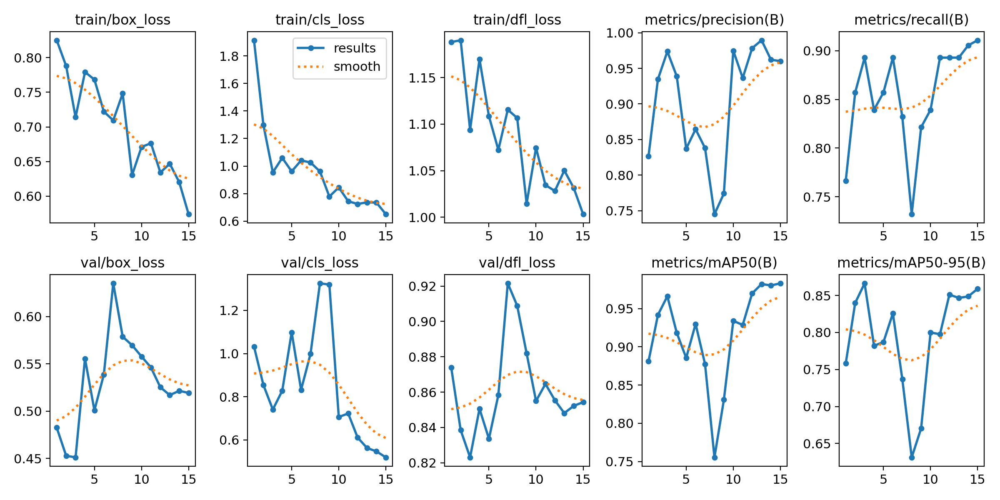

run2_epochs15_bs16_lr0.0005


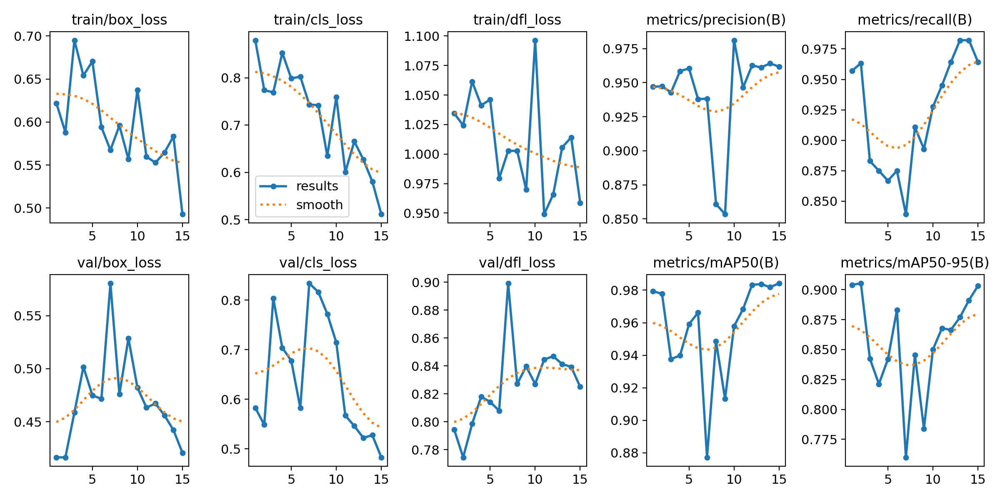

run3_epochs20_bs8_lr0.001


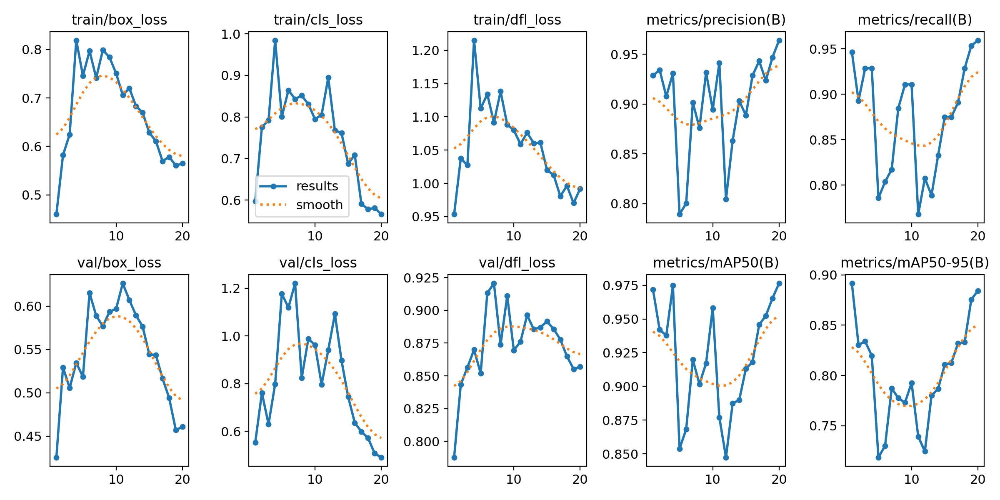

run4_epochs20_bs16_lr0.0005


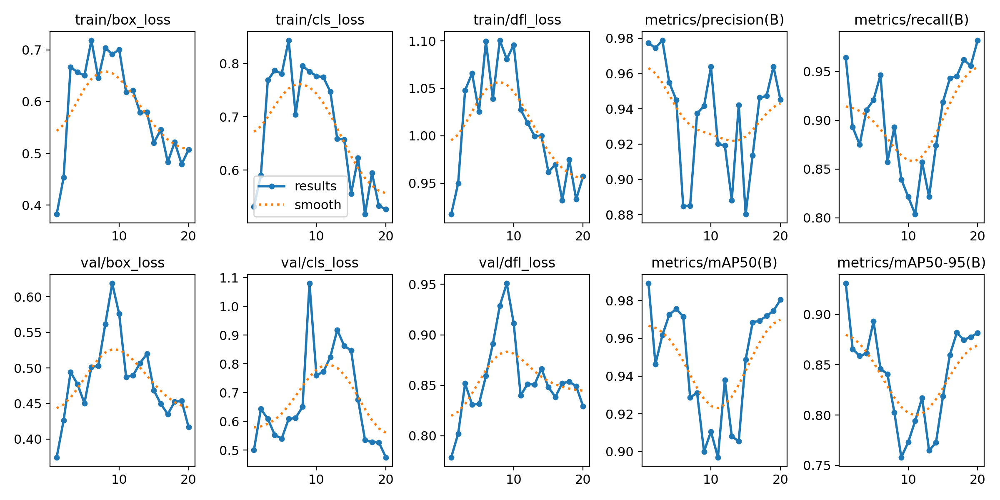

run5_epochs15_bs8_lr0.0005


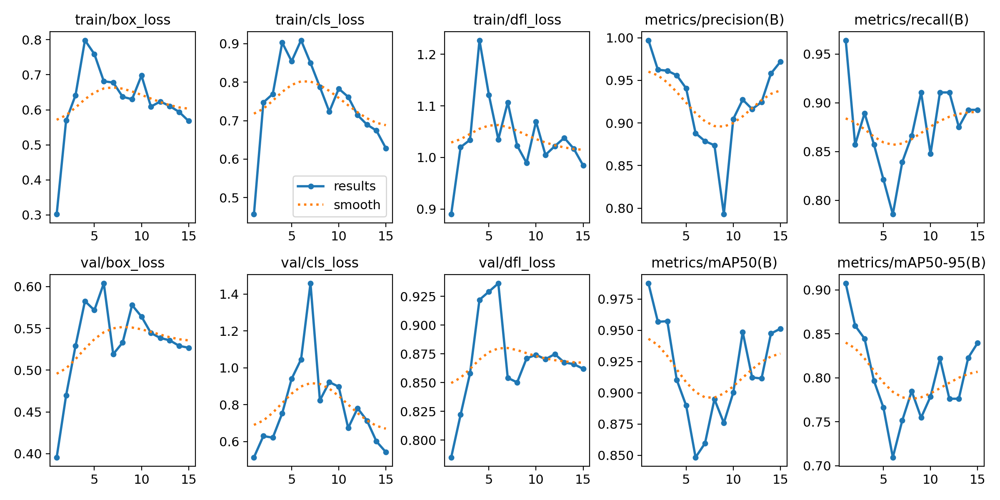

run6_epochs30_bs16_lr0.001


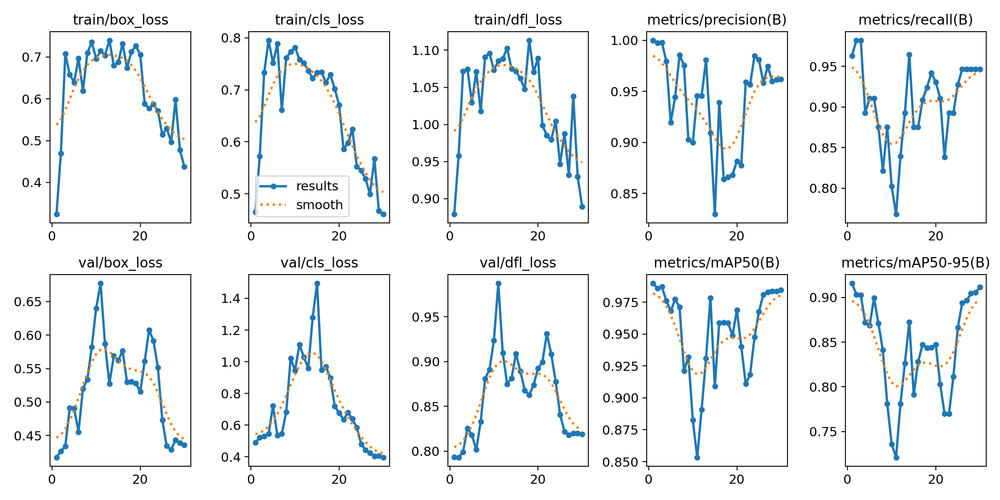

run7_epochs50_bs8_lr0.0005


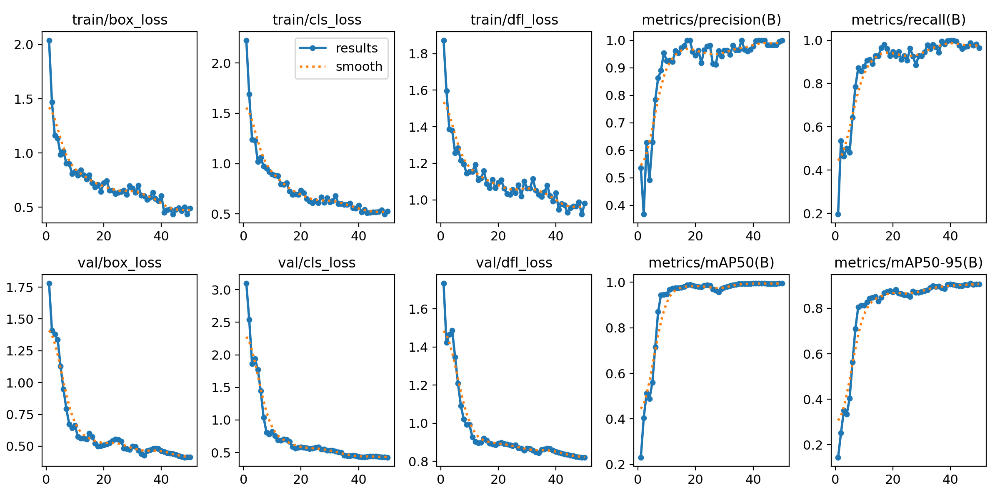

In [ ]:
from IPython.display import Image, display
print("run1_epochs15_bs8_lr0.001")
display(Image(filename='/content/Results/run1_results.png', width=800, height=400))

print("run2_epochs15_bs16_lr0.0005")
display(Image(filename='/content/Results/run2_results.png', width=800, height=400))

print("run3_epochs20_bs8_lr0.001")
display(Image(filename='/content/Results/run3_results.png', width=800, height=400))

print("run4_epochs20_bs16_lr0.0005")
display(Image(filename='/content/Results/run4_results.png', width=800, height=400))

print("run5_epochs15_bs8_lr0.0005")
display(Image(filename='/content/Results/run5_results.png', width=800, height=400))

print("run6_epochs30_bs16_lr0.001")
display(Image(filename='/content/Results/run6_results.png', width=800, height=400))

print("run7_epochs50_bs8_lr0.0005")
display(Image(filename='/content/Results/run7_results.png', width=800, height=400))

compare 4 and 7, 4 gave the lowest val box_loss and highest mAP50-95 and run 7 is most stable

run4_epochs20_bs16_lr0.0005


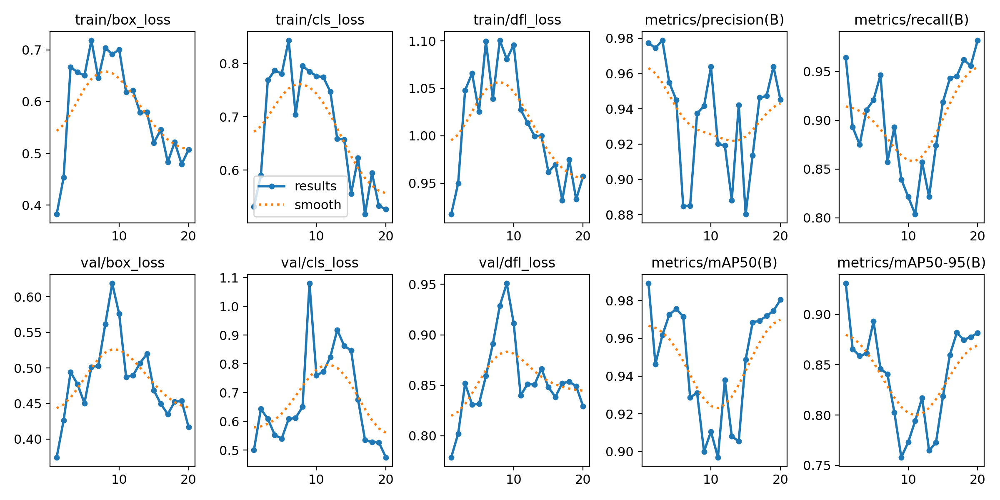

run7_epochs50_bs8_lr0.0005


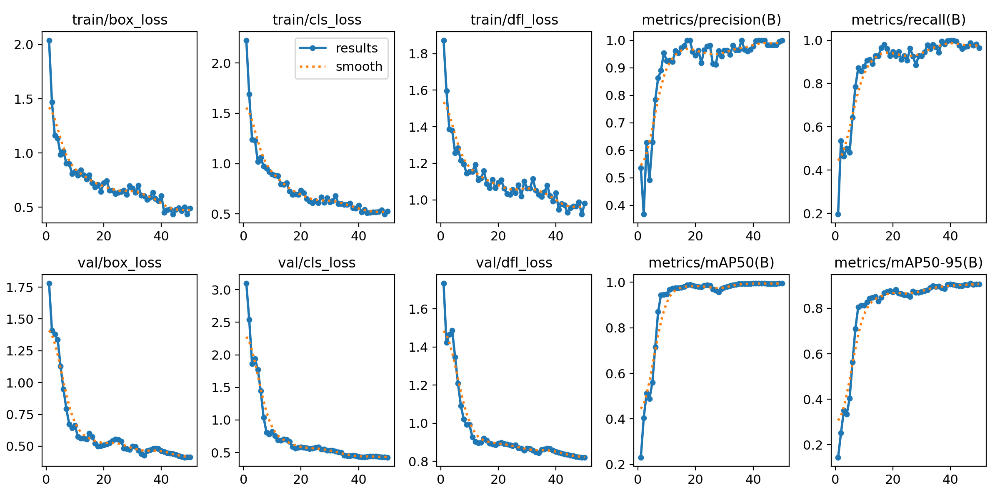

In [ ]:
print("run4_epochs20_bs16_lr0.0005")
display(Image(filename='/content/Results/run4_results.png', width=800, height=400))

print("run7_epochs50_bs8_lr0.0005")
display(Image(filename='/content/Results/run7_results.png', width=800, height=400))

**Why Run 7’s Hyperparameters Worked Best**

Epochs = 50:

- Longer training allowed the model to converge fully, especially with the small dataset size.
- Early stopping might have been applied implicitly (as the metrics plateaued around epoch 30-40).

Learning Rate = 0.0005:

- A lower learning rate prevented overshooting and ensured smoother, gradual convergence.
- Runs with higher learning rates (like 0.001) showed higher loss fluctuations and worse generalization.

Batch Size = 8:

- A smaller batch size worked well for my limited data, leading to better generalization.

**Conclusion**

Run 7 achieves the best balance of:

- Consistent loss reduction without overfitting.
- High and stable precision/recall.
- Superior mAP50 and mAP50-95 performance.

With the limited data subset (100 images), Run 7’s configuration of epochs=50, lr=0.0005, bs=8 allowed the model to learn effectively while avoiding issues of overfitting or undertraining seen in other runs.

In [ ]:
!zip -r /content/run7.zip /content/lego_detection/run7_epochs50_bs8_lr0.0005

  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/ (stored 0%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/args.yaml (deflated 54%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/train_batch2.jpg (deflated 4%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/P_curve.png (deflated 19%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/confusion_matrix_normalized.png (deflated 39%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/events.out.tfevents.1733656461.02d33c4235e1.1176.6 (deflated 90%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/train_batch1.jpg (deflated 4%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/results.csv (deflated 61%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/F1_curve.png (deflated 16%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/train_batch360.jpg (deflated 9%)
  adding: content/lego_detection/run7_epochs50_bs8_lr0.0005/train_batch0

In [ ]:
from google.colab import files
files.download('/content/run7.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Rubric for Model Training Section

| Criteria                     | Excellent (9-10)  | Good (5-8)            | Needs Improvement (1-4) |
|------------------------------|----------------|------------------------|--------------------------|
| **Model Configuration**      | Accurately configures the YOLO model with appropriate input dimensions and class setup. | Configures the model but with minor issues or incomplete settings. | Incorrect model configuration, improper input settings, or missing details. |
| **Training Process**         | Executes training with well-justified hyperparameters and shows understanding of tuning. | Executes training but with minor hyperparameter issues or limited tuning. | Incorrect or insufficient training setup, no explanation of hyperparameters. |
| **Code Documentation**       | Provides clear, insightful comments explaining each step of the training process. | Provides some comments, but lacks depth or clarity in parts. | Little to no comments, or fails to explain the training steps adequately. |

### 2.3 Evaluating the Model’s Performance

#### Overview of Model Evaluation

After training, it’s essential to evaluate the model’s performance to ensure it accurately detects LEGO pieces in various images. In object detection tasks, the [**mean Average Precision (mAP)**](https://www.v7labs.com/blog/mean-average-precision) is a standard metric for measuring accuracy. For this project, we will evaluate the model using `mAP@0.5`, calculated at an [Intersection over Union (IoU)](https://www.v7labs.com/blog/intersection-over-union-guide) threshold of 0.5.

#### Key Evaluation Metrics

1. **Intersection over Union (IoU)**: Measures the overlap between the predicted bounding box and the ground truth box. IoU is a crucial factor in determining whether a detection is a true positive. For more on IoU, see [IoU explanation](https://www.v7labs.com/blog/intersection-over-union-guide).
2. **Precision and Recall**: Precision measures the accuracy of predictions, while recall indicates the model's ability to detect all relevant objects.
3. **Mean Average Precision (mAP)**: Aggregates precision across multiple IoU thresholds to provide a single accuracy metric.  For this project, we will focus on mAP@0.5.

---

### Instructions for This Section

1. **Calculate IoU for Predictions**:
   - Calculate IoU for each predicted bounding box against the ground truth.
2. **Compute Precision and Recall**:
   - Use the IoU results to compute precision and recall for each image.
3. **Calculate `mAP@0.5`**:
   - Use the provided starter code to calculate mAP, which will give you an overall assessment of model performance.

**Deliverables for This Section**:
- Documentation on the evaluation metrics and how they were applied.
- A summary of the model’s performance on the test dataset.

checking image dimensions

In [10]:
from PIL import Image

# Specify the path to a sample image in the validation folder
sample_image_path = '/content/legodata_subset/split/images/val/07d475d0-e66a-11eb-8b54-b0c090bd3910.jpg'  # Get the first image in the directory

# Open the image using PIL's Image class
with Image.open(sample_image_path) as img:
    # Retrieve the dimensions (width and height) of the image
    image_width, image_height = img.size

# Print the image dimensions (width and height)
print(f"Image width: {image_width}, Image height: {image_height}")


Image width: 300, Image height: 300


Resizing the validation dataset so its easier for evaluation when comparing predition and ground truth

In [11]:
# Function to resize an image to a specific size
def resize_image(image_path, output_size=(640, 640)):
    # Read the image from the given file path
    image = cv.imread(image_path)

    # Resize the image to the specified size
    resized_image = cv.resize(image, output_size)

    # Return the resized image
    return resized_image

# Define the path to the ground truth images and where resized images will be saved
ground_truth_path = '/content/legodata_subset/split/images/val'
resized_gt_path = '/content/legodata_subset/split/images/val_resized'

# Check if the resized images folder exists; if not, create it
if not os.path.exists(resized_gt_path):
    os.makedirs(resized_gt_path)

# Loop through all images in the ground truth folder
for image_file in os.listdir(ground_truth_path):
    # Construct the full file path of the image
    input_image = os.path.join(ground_truth_path, image_file)

    # Resize the image using the resize_image function
    resized_image = resize_image(input_image)

    # Save the resized image to the new folder
    cv.imwrite(os.path.join(resized_gt_path, image_file), resized_image)


In [16]:
def resize_ground_truth_labels(annotations_path, resized_image_path, output_path, output_size=(640, 640)):
    """
    Resizes the ground truth bounding boxes to match the resized images.
    Arguments:
    - annotations_path: Path to the original annotations (label files) for the ground truth bounding boxes.
    - resized_image_path: Path to the resized images corresponding to the annotations.
    - output_path: Path where resized label files will be saved.
    - output_size: The target size to resize images and bounding boxes to, default is (640, 640).
    """

    # Check if the output directory exists; if not, create it
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    # Loop through all label files in the annotations folder
    for label_file in os.listdir(annotations_path):
        label_path = os.path.join(annotations_path, label_file)  # Full path to the current label file
        image_path = os.path.join(resized_image_path, label_file.replace('.txt', '.jpg'))  # Corresponding image file

        # Read the image to get its dimensions (width and height)
        image = cv.imread(image_path)
        h, w, _ = image.shape  # Image height and width
        resized_image = cv.resize(image, output_size)  # Resize image (this step is not needed for labels, but it's here for context)

        # Open the label file and read each line (each line represents a bounding box in YOLO format)
        with open(label_path, 'r') as f:
            lines = f.readlines()

        # Open the output file to write the resized bounding boxes
        with open(os.path.join(output_path, label_file), 'w') as f:
            for line in lines:
                parts = line.strip().split()  # Split the line into parts (class_id, x_center, y_center, width, height)
                class_id = parts[0]  # Class ID of the object in the bounding box
                x_center, y_center, width, height = map(float, parts[1:])  # Convert bounding box values to floats

                # Resize the bounding box to match the resized image dimensions
                new_x_center = x_center * output_size[0] / w  # Resize x_center
                new_y_center = y_center * output_size[1] / h  # Resize y_center
                new_width = width * output_size[0] / w  # Resize width
                new_height = height * output_size[1] / h  # Resize height

                # Write the resized bounding box to the output label file
                f.write(f"{class_id} {new_x_center} {new_y_center} {new_width} {new_height}\n")

annotations_path = '/content/legodata_subset/split/labels/val'  # Path to the original annotations
resized_image_path = '/content/legodata_subset/split/images/val_resized'  # Path to resized images
output_path = '/content/legodata_subset/split/labels/val_resized'  # Path to save resized label files

# Call the function to resize the ground truth labels
resize_ground_truth_labels(annotations_path, resized_image_path, output_path)

In [13]:
from ultralytics import YOLO

# Load the final trained YOLO model using the path to the model's weights file
model = YOLO('/content/lego_detection/run7_epochs50_bs8_lr0.0005/weights/last.pt')

# Specify the path to the resized validation dataset
resized_gt_path = '/content/legodata_subset/split/images/val_resized'

# Run inference (make predictions) on the resized validation images
results = model(resized_gt_path,  # Path to the folder containing resized validation images
                imgsz=640,  # Specify the image size to resize input images to (640x640)
                save=True,  # Save the output images with predictions drawn on them
                save_txt=True,  # Save the prediction results in text files (bounding box coordinates, class, confidence)
                save_conf=True,  # Save the confidence scores of each prediction in the text files
                show_conf=True,  # Display the confidence score on the images
                show_boxes=True  # Display the bounding boxes on the images
               )




image 1/15 /content/legodata_subset/split/images/val_resized/07d475d0-e66a-11eb-8b54-b0c090bd3910.jpg: 640x640 2 LEGO_pieces, 811.3ms
image 2/15 /content/legodata_subset/split/images/val_resized/178cc63e-e66b-11eb-ba15-b0c090bd3910.jpg: 640x640 2 LEGO_pieces, 591.3ms
image 3/15 /content/legodata_subset/split/images/val_resized/2889242c-e664-11eb-a1f0-b0c090bd3910.jpg: 640x640 2 LEGO_pieces, 553.2ms
image 4/15 /content/legodata_subset/split/images/val_resized/3ecd503a-e4a2-11eb-98f4-b0c090bd3910.jpg: 640x640 3 LEGO_pieces, 614.8ms
image 5/15 /content/legodata_subset/split/images/val_resized/4053a174-d9f8-11eb-ae39-3497f683a169.jpg: 640x640 4 LEGO_pieces, 903.0ms
image 6/15 /content/legodata_subset/split/images/val_resized/90a262ec-db1e-11eb-9358-3497f683a169.jpg: 640x640 4 LEGO_pieces, 886.2ms
image 7/15 /content/legodata_subset/split/images/val_resized/969d3cc8-d9e4-11eb-868a-3497f683a169.jpg: 640x640 5 LEGO_pieces, 863.3ms
image 8/15 /content/legodata_subset/split/images/val_resized/

In [14]:
# Evaluate the model on the val set (this will calculate mAP, precision, recall, etc.)
eval = model.val(data='/content/legodata_subset/split/dataset.yaml')

# Display mAP@0.5 and other metrics
print(eval)

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)


100%|██████████| 755k/755k [00:00<00:00, 12.4MB/s]
val: Scanning /content/legodata_subset/split/labels/val... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<00:00, 1115.37it/s]

val: New cache created: /content/legodata_subset/split/labels/val.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.24s/it]


                   all         15         52      0.934      0.904      0.951      0.853
Speed: 15.3ms preprocess, 718.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e8ceb8dce80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033

In [32]:
# Access values from the results_dict
print("mAP@0.5:", eval.results_dict['metrics/mAP50(B)'])  # mAP at IoU threshold 0.5
print("mAP@0.5:0.95:", eval.results_dict['metrics/mAP50-95(B)'])  # mAP at IoU thresholds 0.5:0.95
print("Precision:", eval.results_dict['metrics/precision(B)'])  # Precision value
print("Recall:", eval.results_dict['metrics/recall(B)'])  # Recall value

mAP@0.5: 0.9510194811747883
mAP@0.5:0.95: 0.852708984839564
Precision: 0.9335386092340539
Recall: 0.9038461538461539



---

### Manual Calculation Evaluation Metrics

---


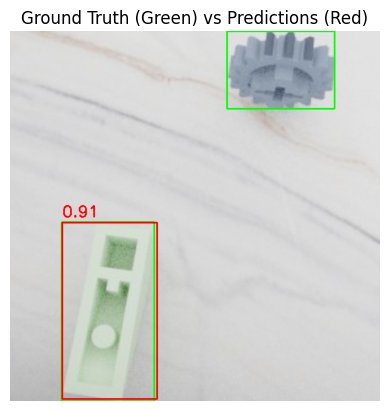

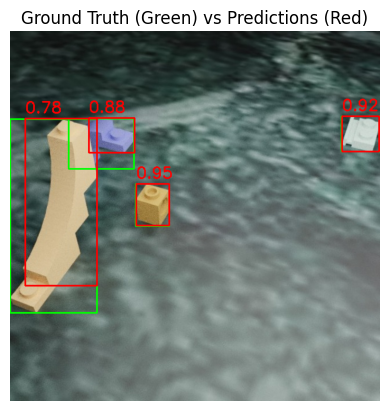

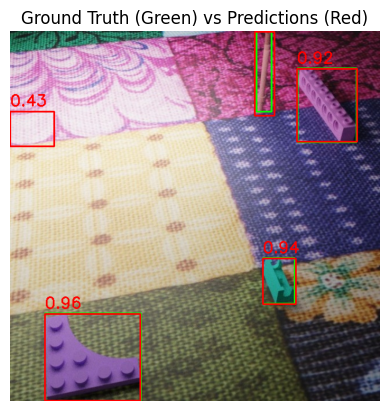

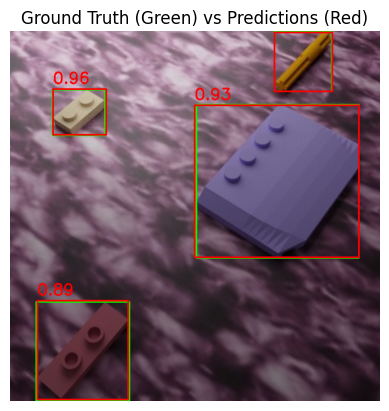

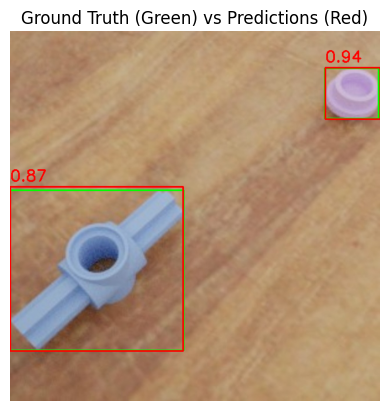

...

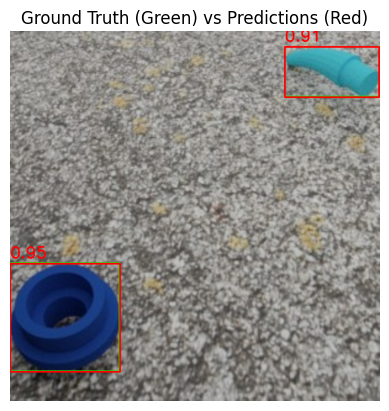

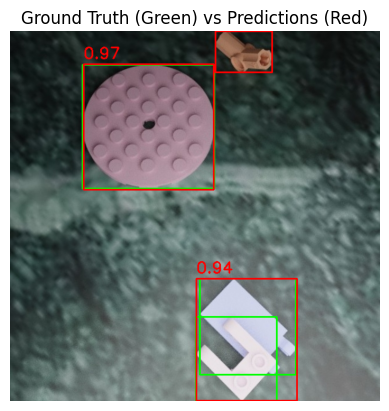

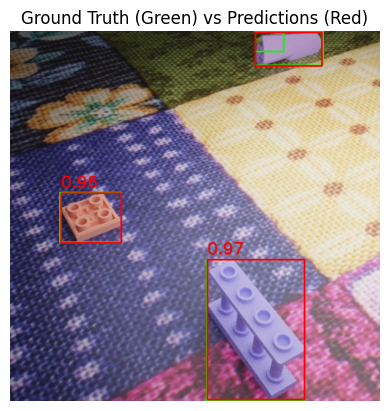

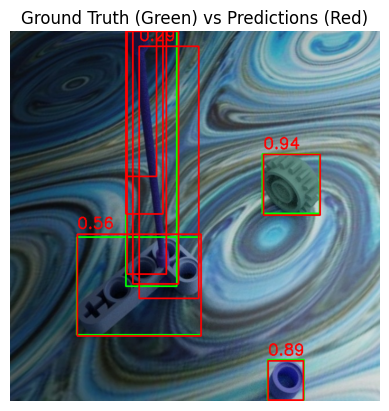

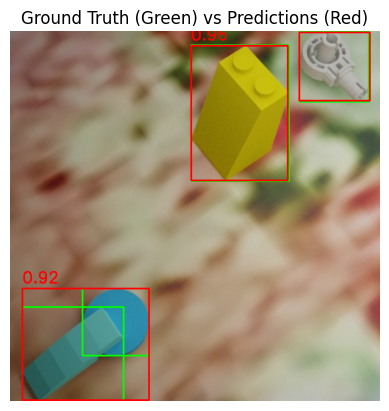

In [37]:
# Function to calculate IoU
def calculate_iou(box1, box2):
    # Box format: [x1, y1, x2, y2]
    # Find the coordinates of the intersection area
    x1 = max(box1[0], box2[0])  # Take the maximum of the leftmost edges (x1)
    y1 = max(box1[1], box2[1])  # Take the maximum of the topmost edges (y1)
    x2 = min(box1[2], box2[2])  # Take the minimum of the rightmost edges (x2)
    y2 = min(box1[3], box2[3])  # Take the minimum of the bottommost edges (y2)

    # Calculate the area of the intersection
    intersection = max(0, x2 - x1) * max(0, y2 - y1)  # Ensure positive area (0 if no intersection)

    # Calculate the area of each box
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])  # Width * Height of box1
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])  # Width * Height of box2

    # Calculate the union area by adding the areas of both boxes and subtracting the intersection area
    union = box1_area + box2_area - intersection

    # Return the IoU (Intersection over Union) if the union is non-zero, else return 0
    return intersection / union if union != 0 else 0

# Combined function to calculate overall precision, recall, and mAP
def calculate_metrics(all_predictions, all_ground_truths, iou_threshold=0.5):
    total_tp = 0  # Total True Positives (TP)
    total_fp = 0  # Total False Positives (FP)
    total_fn = 0  # Total False Negatives (FN)
    precision_list = []  # To store precision values for each image
    recall_list = []  # To store recall values for each image

    # Loop through all images
    for predictions, ground_truths in zip(all_predictions, all_ground_truths):
        tp = 0  # True Positives for the current image
        fp = 0  # False Positives for the current image
        fn = 0  # False Negatives for the current image

        # Compare each ground truth with predictions for the current image
        for gt in ground_truths:
            max_iou = 0  # Initialize max IoU for the current ground truth
            best_prediction = None  # Track the best matching prediction

            # Compare with each prediction
            for pred in predictions:
                iou = calculate_iou(gt, pred[:4])  # Calculate IoU (pred[:4] excludes the confidence score)
                if iou > max_iou:
                    max_iou = iou  # Update max IoU
                    best_prediction = pred  # Track the best prediction

            # If IoU exceeds threshold, it's a true positive (TP)
            if max_iou >= iou_threshold:
                tp += 1
                predictions.remove(best_prediction)  # Remove matched prediction from further comparison
            else:
                fn += 1  # If no match, it's a false negative (FN)

        # Remaining predictions are false positives (FP)
        fp = len(predictions)  # Remaining predictions are false positives

        # Calculate Precision and Recall for the current image
        precision = tp / (tp + fp) if (tp + fp) != 0 else 0
        recall = tp / (tp + fn) if (tp + fn) != 0 else 0

        # Accumulate total TP, FP, and FN
        total_tp += precision * len(ground_truths)
        total_fp += (1 - precision) * len(predictions)
        total_fn += (1 - recall) * len(ground_truths)

        # Store precision and recall for each image
        precision_list.append(precision)
        recall_list.append(recall)

    # Calculate overall Precision and Recall
    overall_precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) != 0 else 0
    overall_recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) != 0 else 0

    # Calculate mAP (Mean Average Precision)
    mAP = np.mean(precision_list)

    return overall_precision, overall_recall, mAP

# Function to visualize the comparison between predictions and ground truths
def visualize_comparison(image_path, predictions, ground_truths):
    # Load image
    image = cv.imread(image_path)
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    # Draw ground truth boxes (green)
    for gt in ground_truths:
        x1, y1, x2, y2 = gt
        cv.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)  # Green color

    # Draw predicted boxes (red) with confidence score
    for pred in predictions:
        x1, y1, x2, y2, score = pred
        cv.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)  # Red color
        cv.putText(image_rgb, f"{score:.2f}", (int(x1), int(y1)-10), cv.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    # Display the image with bounding boxes
    plt.imshow(image_rgb)
    plt.title("Ground Truth (Green) vs Predictions (Red)")
    plt.axis('off')
    plt.show()

# Paths
val_image_path = '/content/legodata_subset/split/images/val_resized'  # Validation images (resized to 640x640)
val_annotations_path = '/content/legodata_subset/split/labels/val_resized'  # Ground truth labels resized to 640x640
pred_bound_boxes_path = '/content/runs/detect/predict/labels'  # Predicted bounding boxes (640x640)

# Store results
all_predictions = []
all_ground_truths = []

# Loop over all images in the validation set
for image_filename in os.listdir(val_image_path):
    if image_filename.endswith('.jpg'):  # Process only .jpg images
        image_path = os.path.join(val_image_path, image_filename)

        # Load ground truth labels
        gt_filename = image_filename.replace('.jpg', '.txt')  # Assuming labels are in .txt format with the same name
        ground_truths = []
        with open(os.path.join(val_annotations_path, gt_filename), 'r') as f:
            for line in f:
                # Convert the label format [class, x_center, y_center, width, height] to [x1, y1, x2, y2]
                parts = line.strip().split()
                x_center, y_center, width, height = map(float, parts[1:])
                x1 = (x_center - width / 2) * 640  # Rescale to original image size (640x640)
                y1 = (y_center - height / 2) * 640
                x2 = (x_center + width / 2) * 640
                y2 = (y_center + height / 2) * 640
                ground_truths.append([x1, y1, x2, y2])

        # Load predicted bounding boxes
        predictions = []
        predictions_filename = image_filename.replace('.jpg', '.txt')  # Assuming predictions are in .txt format
        with open(os.path.join(pred_bound_boxes_path, predictions_filename), 'r') as f:
            for line in f:
                parts = line.strip().split()
                # The prediction format is: <class_id> <x_center> <y_center> <width> <height> <confidence>
                # Convert the box to [x1, y1, x2, y2] and include confidence score
                class_id, x_center, y_center, width, height, confidence = map(float, parts)

                # Convert YOLO format to [x1, y1, x2, y2]
                x1 = (x_center - width / 2) * 640  # Rescale to original image size (640x640)
                y1 = (y_center - height / 2) * 640
                x2 = (x_center + width / 2) * 640
                y2 = (y_center + height / 2) * 640

                # Append the bounding box coordinates and confidence score
                predictions.append([x1, y1, x2, y2, confidence])

        # Store predictions and ground truths for mAP calculation
        all_predictions.append(predictions)
        all_ground_truths.append(ground_truths)

        # Visualize the comparison
        visualize_comparison(image_path, predictions, ground_truths)

# Calculate mAP
mAP, precision_list, recall_list = calculate_metrics(all_predictions, all_ground_truths)


In [31]:
# Manual Calculation

print(f"Overall Precision: {precision_list}")
print(f"Overall Recall: {recall_list}")
print(f"mAP @ 0.5: {mAP}")

Overall Precision: 0.9045801526717557
Overall Recall: 0.9233333333333333
mAP @ 0.5: 0.9470529470529471


In [35]:
# Evaluation Metrics using YOLO API

print("Precision:", eval.results_dict['metrics/precision(B)'])  # Precision value
print("Recall:", eval.results_dict['metrics/recall(B)'])  # Recall value
print("mAP@0.5:", eval.results_dict['metrics/mAP50(B)'])  # mAP at IoU threshold 0.5
print("mAP@0.5:0.95:", eval.results_dict['metrics/mAP50-95(B)'])  # mAP at IoU thresholds 0.5:0.95

Precision: 0.9335386092340539
Recall: 0.9038461538461539
mAP@0.5: 0.9510194811747883
mAP@0.5:0.95: 0.852708984839564


**Manual Calculation vs. YOLO API Evaluation:**
- Compared manual calculation results with YOLO API evaluation to ensure accuracy and consistency.
- Used the YOLO API as a fact-checking tool to validate custom functions for calculating precision, recall, and mAP.

**Precision:**
- Manual Calculation: Measures how many predicted bounding boxes are accurate.
- YOLO API: Precision value = 0.9335, indicating 93.35% of predictions are correct.
- Conclusion: The manual and API precision values are very close, validating the manual calculations.

**Recall:**
- Manual Calculation: Measures how many ground truth boxes were detected.
- YOLO API: Recall value = 0.9038, meaning the model detects 90.38% of ground truth objects.
- Conclusion: The recall values from both methods are consistent, confirming the accuracy of the manual function.

**mAP (Mean Average Precision):**
- Manual Calculation mAP@0.5: Measures performance at a 0.5 IoU threshold.
- YOLO API: mAP@0.5 = 0.9510, indicating high precision for object detection.
YOLO API mAP@0.5:0.95: mAP = 0.8527, assessing precision across stricter IoU thresholds (0.5 to 0.95).
- Conclusion: Both manual and API mAP values align closely, confirming the reliability of manual calculations.

**Overall Conclusion:**
The manual calculation functions work accurately, as validated by the YOLO API.
Results show strong model performance with high precision, recall, and mAP.
The comparison demonstrates the effectiveness of using API results for fact-checking custom functions and ensuring consistency.

### Rubric for Model Evaluation Section

| Criteria                     | Excellent (9-10)  | Good 5-8)            | Needs Improvement (1-4) |
|------------------------------|----------------|------------------------|--------------------------|
| **Precision, Recall, and mAP** | Accurately calculates and interprets precision, recall, and mAP. | Provides calculations but lacks full clarity or accuracy in parts. | Incomplete or incorrect calculations, limited interpretation. |
| **Analysis of Results**      | Provides a detailed analysis of model performance, interpreting mAP in the context of object detection. | Provides some analysis, but lacks depth or full clarity on mAP significance. | Little to no analysis, fails to connect mAP results to model performance. |



---
---
# Inference
---
---


### 2.4 Saving the Model and Performing Inference on New Images

#### Model Saving and Loading

Once the model has been trained and evaluated, it's useful to save it so that it can be easily reloaded for inference on new data. In this section, you'll save your trained model to a file and load it again to perform object detection on new images.

#### Performing Inference

Inference refers to using the trained model to make predictions on new data. This involves:
1. **Loading the Saved Model**: Load the model from the saved file.
2. **Processing New Images**: Prepare new images for the model, including resizing and normalizing.
3. **Running the Model on New Images**: Use the model to predict bounding boxes on new images.
4. **Displaying Predictions**: Visualize the detected bounding boxes on the new images to verify the model’s performance.

---

### Instructions for This Section

1. **Save the Model**:
   - Use PyTorch’s [`torch.save()`](https://pytorch.org/docs/main/generated/torch.save.html) function to save your model’s weights.
2. **Load the Model for Inference**:
   - Use [`torch.load()`](https://pytorch.org/docs/stable/generated/torch.load.html) to reload the model for predictions.
3. **Run Inference on a New Image**:
   - Prepare a new image and use the loaded model to detect LEGO pieces.
4. **Visualize the Output**:
   - Draw bounding boxes on the image and display the results using Matplotlib.

**Deliverables for This Section**:
- Document the model saving and loading process.
- Demonstrate inference on a new image with visualized results.

Because I did many experiment runs with different combinations of hyperparameters to get the best model, I saved all the models for each run and picked the best from there.

I already saved the model in the early part of the notebook.


image 1/15 /content/legodata_subset/split/images/test/13119f5c-da60-11eb-8560-3497f683a169.jpg: 640x640 4 LEGO_pieces, 978.7ms
image 2/15 /content/legodata_subset/split/images/test/2c511086-da3e-11eb-9f05-3497f683a169.jpg: 640x640 4 LEGO_pieces, 832.3ms
image 3/15 /content/legodata_subset/split/images/test/45543aba-e302-11eb-b42b-b0c090bd3910.jpg: 640x640 4 LEGO_pieces, 854.3ms
image 4/15 /content/legodata_subset/split/images/test/6967bd9c-db14-11eb-8600-3497f683a169.jpg: 640x640 4 LEGO_pieces, 717.4ms
image 5/15 /content/legodata_subset/split/images/test/74e0783a-e7bc-11eb-9085-b0c090bd3910.jpg: 640x640 3 LEGO_pieces, 524.4ms
image 6/15 /content/legodata_subset/split/images/test/78494d46-da3c-11eb-a3dc-3497f683a169.jpg: 640x640 4 LEGO_pieces, 552.0ms
image 7/15 /content/legodata_subset/split/images/test/92317ed4-da40-11eb-a61b-3497f683a169.jpg: 640x640 4 LEGO_pieces, 522.7ms
image 8/15 /content/legodata_subset/split/images/test/9bcac282-dad4-11eb-97d1-3497f683a169.jpg: 640x640 4 LEGO

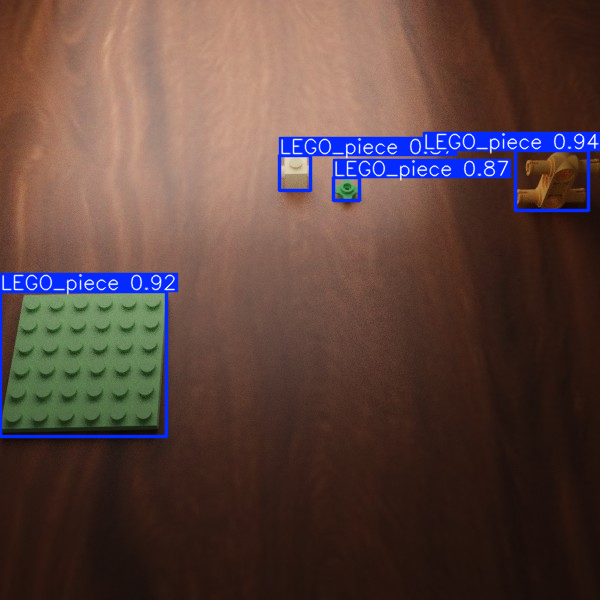

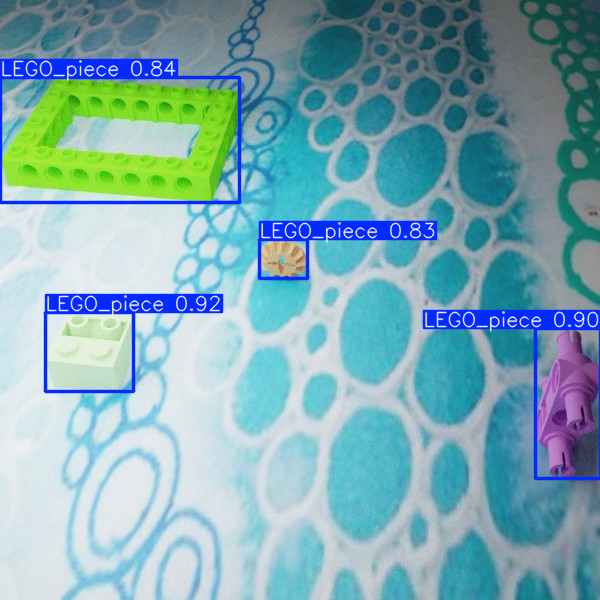

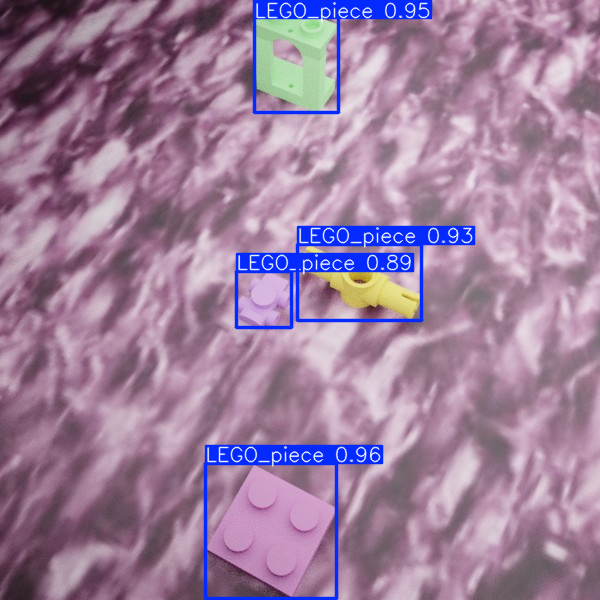

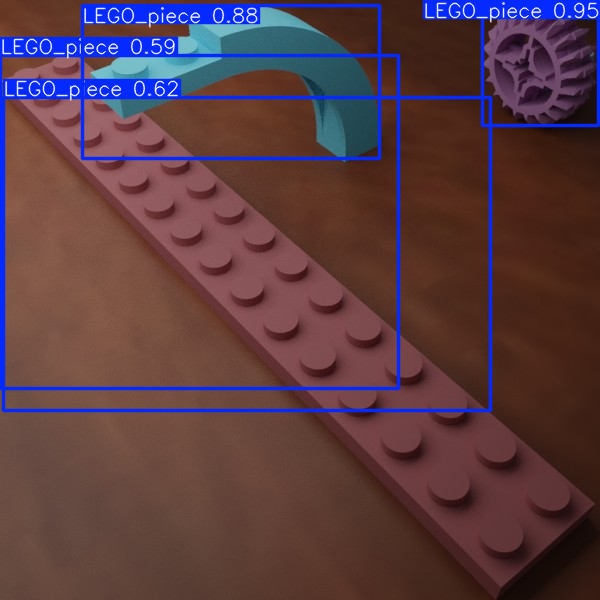

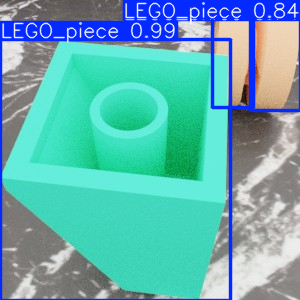

...

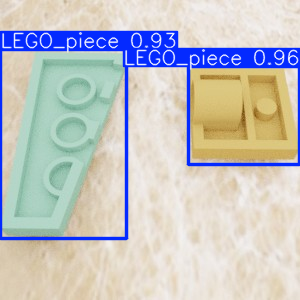

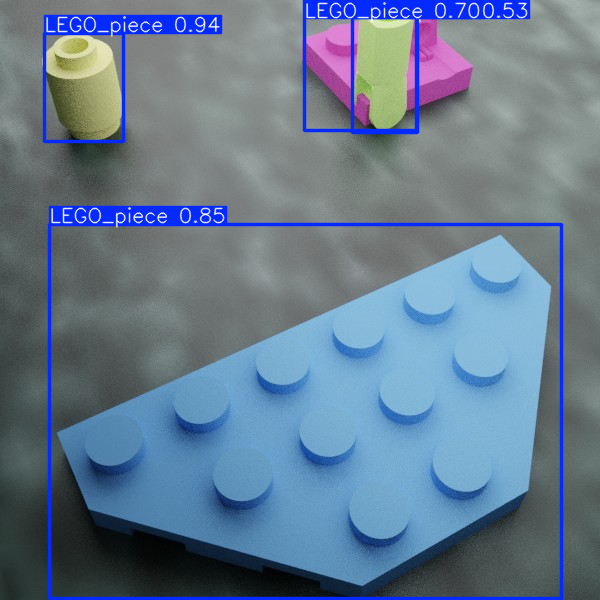

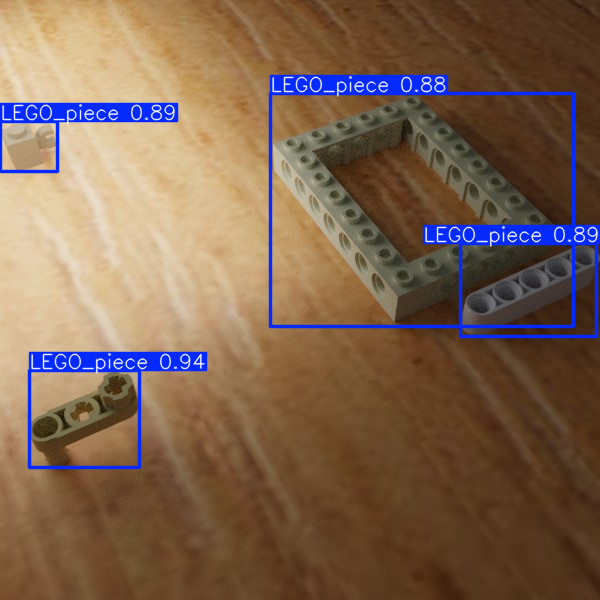

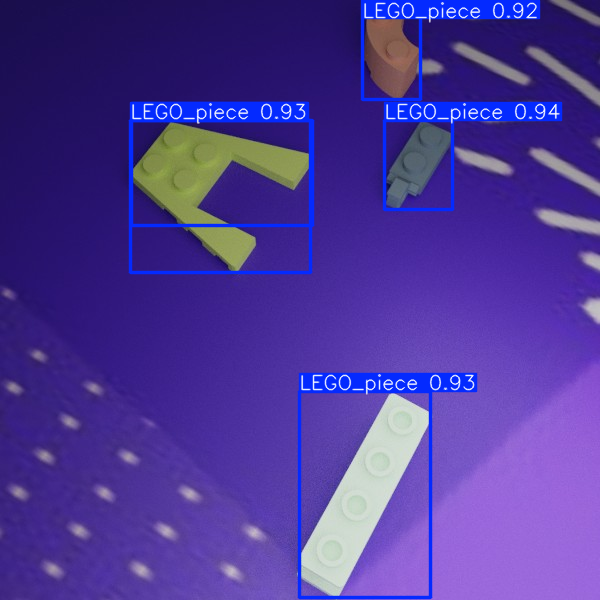

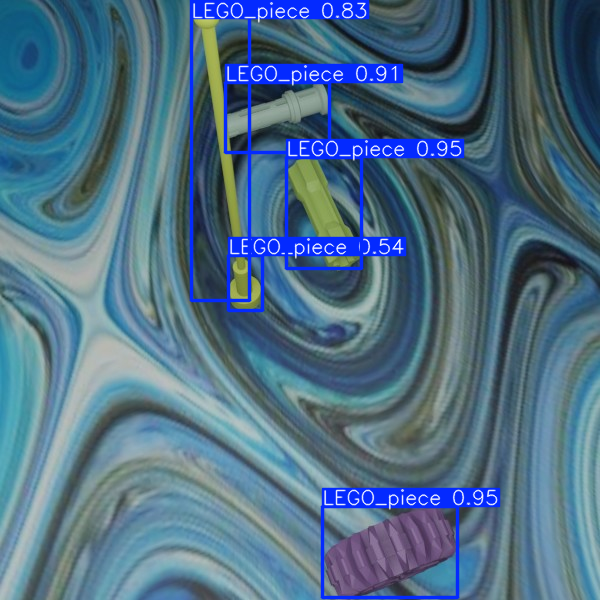

In [30]:
# Load the trained YOLO model
model = YOLO('/content/lego_detection/run7_epochs50_bs8_lr0.0005/weights/last.pt')

# Specify test dataset path
test_data_path = '/content/legodata_subset/split/images/test'

# Run inference/ make prediction on test data
inference = model(test_data_path,
                  conf = 0.5, # only show those with confidence > .50
                  save=False,  # Save results (images with bounding boxes)
                  save_txt=False,  # Save results in text files
                  show_conf=True,  # Show confidence scores
                  show_boxes=True  # Show bounding boxes in the plot
                  )

for result in inference:
    result.show()

### Rubric for Model Saving and Inference Section

| Criteria                     | Excellent (5)  | Good (3-4)            | Needs Improvement (1-2) |
|------------------------------|----------------|------------------------|--------------------------|
| **Inference** | Successfully performs inference with accurate predictions. | Performs inference, but with minor issues. | Fails to perform inference correctly. |
| **Visualization of Results** | Provides clear and accurate visualization of predicted bounding boxes on new images. | Visualization is somewhat clear, but minor improvements needed. | Poor visualization, inaccurate bounding boxes, or lacks clarity. |